# 1.&nbsp; Import Libraries

First things first is import the necessary libraries

In [ ]:
# !pip install split-folders
!pip install rembg
!pip install onnxruntime

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.1/44.1 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.7/54.7 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.5/16.5 MB 107.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 7.1 MB/s eta 0:00:00


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import random
import cv2
import glob
from io import BytesIO
import os
import re
import PIL
from PIL import Image
import shutil
import pathlib
# import splitfolders
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, array_to_img
from tensorflow.keras.preprocessing import image
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras import layers, models
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dense, Input, Conv2D, MaxPooling2D, concatenate, BatchNormalization
from tensorflow.keras.models import Model, Sequential, load_model
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score, precision_score, classification_report
import gc
from google.colab import files
# from rembg import remove
import time
import io
from scipy.stats import chi2
from statsmodels.stats.contingency_tables import mcnemar
from statsmodels.stats.multitest import multipletests

import warnings
warnings.filterwarnings("ignore")

In [ ]:
print(tf.__version__)

print(tf.config.list_physical_devices('GPU'))

if tf.config.list_physical_devices('GPU'):
    print("TensorFlow is using GPU.")
else:
    print("TensorFlow is using CPU.")

2.19.0
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
TensorFlow is using GPU.


#2.&nbsp;Load Dataset

Then mount the dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
src = '/content/drive/MyDrive/Skripsi/Dataset/original_dataset'
dst = '/content/original_dataset'

shutil.copytree(src, dst)
print("Successfully copied to local Colab")

Successfully copied to local Colab


#3.&nbsp;Data Exploration

Just like formality that use to explore the data

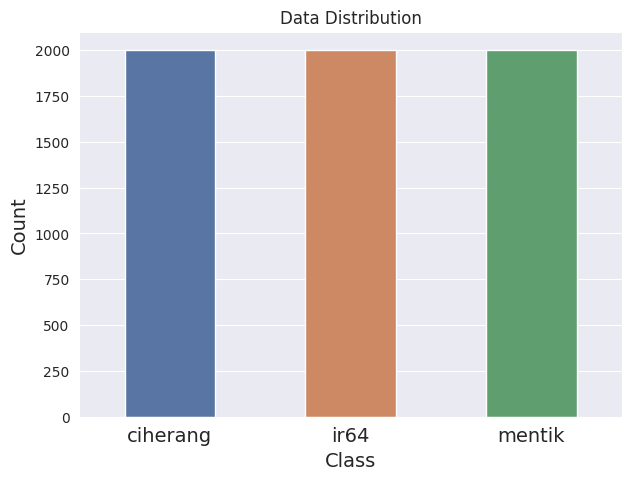

In [ ]:
data = '/content/original_dataset'

ciherang = glob.glob(os.path.join(data, 'ciherang', '*.jpg'))
ir64 = glob.glob(os.path.join(data, 'ir64', '*.jpg'))
mentik = glob.glob(os.path.join(data, 'mentik', '*.jpg'))

rice = [ciherang, ir64, mentik]
rice_classes = ['ciherang', 'ir64', 'mentik']
rice_count = [len(rice_class) for rice_class in rice]

sns.set_style('darkgrid')
plt.figure(figsize=(7, 5))
sns.barplot(x=rice_classes, y=rice_count, palette='deep', width=0.5, )
plt.xlabel('Class', fontsize = 14)
plt.ylabel('Count', fontsize = 14)
plt.xticks(fontsize=14)
plt.title('Data Distribution')
plt.show()

In [ ]:
rice_classes = ['ciherang', 'ir64', 'mentik']
def load_random_img(base_dir, labels, seed=42):
    if seed is not None:
        random.seed(seed)

    plt.figure(figsize=(10, 5))
    for i, label in enumerate(labels):
        class_dir = os.path.join(base_dir, label)
        if os.path.isdir(class_dir):
            image_files = [f for f in os.listdir(class_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]
            if image_files:
                image_path = os.path.join(class_dir, random.choice(image_files))
                sample_img = cv2.imread(image_path)
                if sample_img is not None:
                    plt.subplot(1, len(labels), i + 1)
                    plt.imshow(cv2.cvtColor(sample_img, cv2.COLOR_BGR2RGB))
                    plt.title(label)
                    plt.axis('off')
    plt.show()

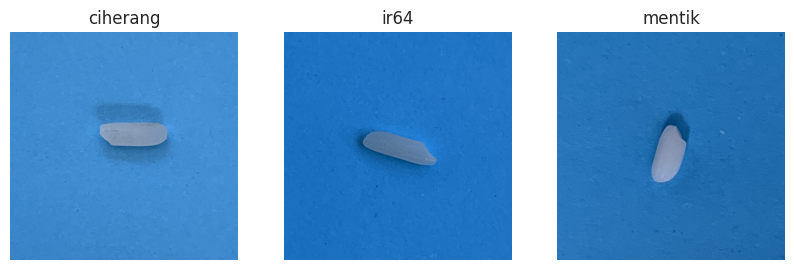

In [ ]:
load_random_img(data, rice_classes)

#4.&nbsp;Data Preprocessing

As we can see, that each images of dataset contain blue-texture background and too broad. So we have to overcome it with the following:


1.   Remove the unecessary background
2.   Convert to grayscale format
3.   Then, crop the image
4.   And revert to RGB format



##4.1&nbsp;Background Removal

To remove the background we employ the rembg library that use the pre-trained model U^2-Net as backbone so the background removing process can be easier and smoother.

In [ ]:
def remove_bg(class_name):
    input_dir = f'/content/original_dataset/{class_name}'
    output_dir = f'/content/drive/MyDrive/Skripsi/Dataset/background_removed/{class_name}'
    os.makedirs(output_dir, exist_ok=True)

    files = [f for f in os.listdir(input_dir) if f.lower().endswith('.jpg')]
    print(f"Removing background for class: {class_name} ({len(files)} images)")

    start_time = time.time()
    for filename in files:
        name_wo_ext = os.path.splitext(filename)[0]
        input_path = os.path.join(input_dir, filename)
        output_path = os.path.join(output_dir, f'no_bg_{name_wo_ext}.png')

        try:
            with open(input_path, 'rb') as inp:
                input_img = inp.read()
                output_img = remove(input_img)

            img = Image.open(io.BytesIO(output_img)).convert("RGBA")
            img.save(output_path, format="PNG")
        except:
            pass

    end_time = time.time()
    duration = end_time - start_time
    minutes = int(duration // 60)
    seconds = int(duration % 60)

    print(f"Finished processing the {class_name} class. Duration: {minutes} minutes {seconds} seconds\n")

In [ ]:
remove_bg('ciherang')

Removing background for class: ciherang (2000 images)


100%|████████████████████████████████████████| 176M/176M [00:00<00:00, 154GB/s]


Finished processing the ciherang class. Duration: 108 minutes 52 seconds



In [ ]:
remove_bg('ir64')

Removing background for class: ir64 (2000 images)
Finished processing the ir64 class. Duration: 106 minutes 8 seconds



In [ ]:
remove_bg('mentik')

Removing background for class: mentik (2000 images)
Finished processing the mentik class. Duration: 106 minutes 15 seconds



After that, we need to visualize the sample after background removing, just make sure that the background removal is work well

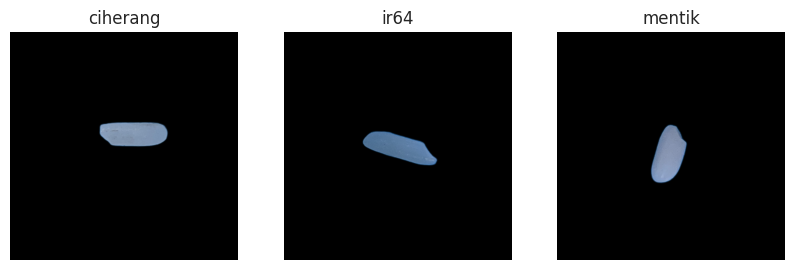

In [ ]:
rembg = "/content/drive/MyDrive/Skripsi/Dataset/background_removed"
load_random_img(rembg, rice_classes)

##4.2&nbsp;Grayscale Conversion

As we can see above, that the color of objcet (rice grain) is effected by the background, due to this we should convert to grayscale format

In [ ]:
def convert2grayscale(class_name):
    input_dir = f'/content/drive/MyDrive/Skripsi/Dataset/background_removed/{class_name}'
    output_dir = f'/content/drive/MyDrive/Skripsi/Dataset/grayscale_no_bg/{class_name}'
    os.makedirs(output_dir, exist_ok=True)

    files = [f for f in os.listdir(input_dir) if f.lower().endswith('.png')]
    print(f"Converting to grayscale: {class_name} ({len(files)} images)")

    start_time = time.time()
    for filename in files:
        input_path = os.path.join(input_dir, filename)
        output_path = os.path.join(output_dir, filename)

        try:
            img = Image.open(input_path).convert("L")
            img.save(output_path)
        except:
            pass

    end_time = time.time()
    duration = end_time - start_time
    minutes = int(duration // 60)
    seconds = int(duration % 60)

    print(f"Finished processing the {class_name} class. Duration: {minutes} minutes {seconds} seconds\n")

In [ ]:
convert2grayscale('ciherang')

Converting to grayscale: ciherang (2000 images)
Finished processing the ciherang class. Duration: 8 minutes 31 seconds



In [ ]:
convert2grayscale('ir64')

Converting to grayscale: ir64 (2000 images)
Finished processing the ir64 class. Duration: 8 minutes 32 seconds



In [ ]:
convert2grayscale('mentik')

Converting to grayscale: mentik (2000 images)
Finished processing the mentik class. Duration: 8 minutes 25 seconds



In [ ]:
def check_grayscale(image_path):
    image = Image.open(image_path)
    if image.mode in ("L", "LA"):
        return "The image is grayscale."
    else:
        return "The image is not grayscale."

img = "/content/drive/MyDrive/Skripsi/Dataset/grayscale_no_bg/ciherang/no_bg_IMG_0001.png"
check_grayscale(img)

'The image is grayscale.'

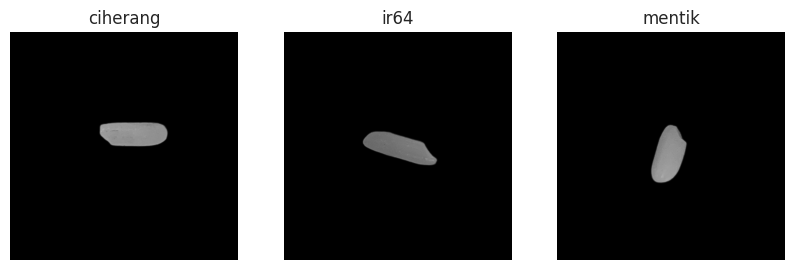

In [ ]:
gryscl = "/content/drive/MyDrive/Skripsi/Dataset/grayscale_no_bg"
load_random_img(gryscl, rice_classes)

##4.3 Image Cropping

After several preprocessing, we still can see that the image have too broad background, this may interfere with the feature extraction process.

In [ ]:
def crop_image(class_name):
    input_dir = f'/content/drive/MyDrive/Skripsi/Dataset/grayscale_no_bg/{class_name}'
    output_dir = f'/content/drive/MyDrive/Skripsi/Dataset/cropped/{class_name}'
    os.makedirs(output_dir, exist_ok=True)

    files = [f for f in os.listdir(input_dir) if f.lower().endswith('.png')]
    print(f"Cropping images: {class_name} ({len(files)} images)")

    start_time = time.time()
    for filename in files:
        input_path = os.path.join(input_dir, filename)
        output_path = os.path.join(output_dir, filename)

        if os.path.exists(output_path):
            continue

        try:
            image = cv2.imread(input_path, cv2.IMREAD_GRAYSCALE)
            if image is None:
                continue

            _, mask = cv2.threshold(image, 10, 255, cv2.THRESH_BINARY)
            contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

            if contours:
                x, y, w, h = cv2.boundingRect(max(contours, key=cv2.contourArea))
                side = int(max(w, h) * 1.5)
                cx, cy = x + w // 2, y + h // 2
                x1, y1 = max(0, cx - side // 2), max(0, cy - side // 2)
                side = min(side, min(image.shape[1] - x1, image.shape[0] - y1))
                cropped = image[y1:y1 + side, x1:x1 + side]
                cv2.imwrite(output_path, cropped)
        except:
            pass

    end_time = time.time()
    duration = end_time - start_time
    minutes = int(duration // 60)
    seconds = int(duration % 60)

    print(f"Finished processing the {class_name} class. Duration: {minutes} minutes {seconds} seconds\n")

In [ ]:
crop_image('ciherang')

Cropping images: ciherang (2000 images)
Finished processing the ciherang class. Duration: 2 minutes 49 seconds



In [ ]:
crop_image('ir64')

Cropping images: ir64 (2000 images)
Finished processing the ir64 class. Duration: 2 minutes 42 seconds



In [ ]:
crop_image('mentik')

Cropping images: mentik (2000 images)
Finished processing the mentik class. Duration: 2 minutes 35 seconds



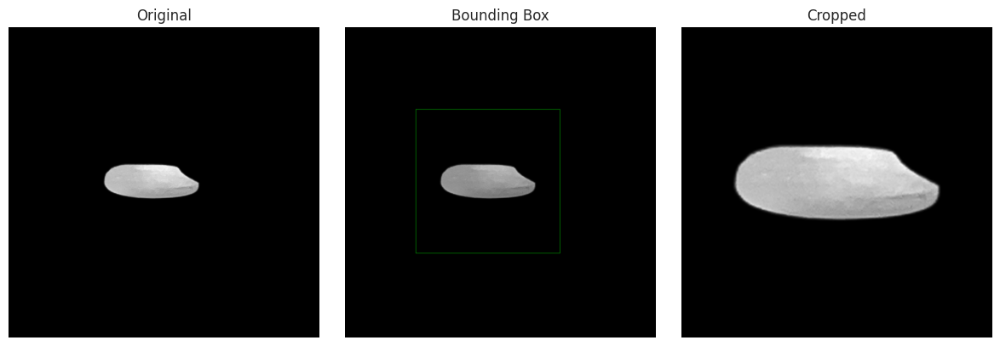

In [ ]:
img = cv2.imread('/content/drive/MyDrive/Skripsi/Dataset/New2/grayscale_no_bg/ciherang/no_bg_IMG_0001.png', cv2.IMREAD_GRAYSCALE)
_, mask = cv2.threshold(img, 10, 255, cv2.THRESH_BINARY)
contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

x, y, w, h = cv2.boundingRect(max(contours, key=cv2.contourArea))
side = int(max(w, h) * 1.5)
cx, cy = x + w // 2, y + h // 2
x1, y1 = max(0, cx - side // 2), max(0, cy - side // 2)
cropped = img[y1:y1 + side, x1:x1 + side]

boxed = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
# cv2.rectangle(boxed, (x, y), (x + w, y + h), (0, 255, 0), 2)
cv2.rectangle(boxed, (x1, y1), (x1 + side, y1 + side), (0, 255, 0), 2)

plt.figure(figsize=(12, 4))
for i, (title, im) in enumerate(zip(['Original', 'Bounding Box', 'Cropped'], [img, boxed, cropped])):
    plt.subplot(1, 3, i + 1)
    plt.imshow(im, cmap='gray' if i != 1 else None)
    plt.title(title)
    plt.axis('off')
plt.tight_layout()
plt.show()

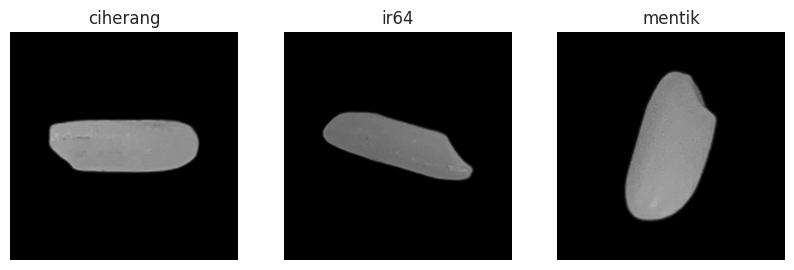

In [ ]:
cropped = "/content/drive/MyDrive/Skripsi/Dataset/cropped"
load_random_img(cropped, rice_classes)

##4.4 RGB Conversion

All the main preprocessing has been done, it's time to revert the format to RGB by using cv2.COLOR_GRAY2RGB, this is final step but not serious final :v

In [ ]:
def convert2rgb(class_name):
    input_dir = f'/content/drive/MyDrive/Skripsi/Dataset/cropped/{class_name}'
    output_dir = f'/content/drive/MyDrive/Skripsi/Dataset/clean_dataset/{class_name}'
    os.makedirs(output_dir, exist_ok=True)

    files = [f for f in os.listdir(input_dir) if f.lower().endswith('.png')]
    print(f"Converting to RGB: {class_name} ({len(files)} images)")

    start_time = time.time()
    for filename in files:
        input_path = os.path.join(input_dir, filename)
        num_img = ''.join(filter(str.isdigit, os.path.splitext(filename)[0]))
        if not num_img:
            continue

        output_path = os.path.join(output_dir, f'clean_IMG_{num_img}.png')
        if os.path.exists(output_path):
            continue

        try:
            gray_img = cv2.imread(input_path, cv2.IMREAD_GRAYSCALE)
            if gray_img is None:
                continue
            rgb_img = cv2.cvtColor(gray_img, cv2.COLOR_GRAY2RGB)
            cv2.imwrite(output_path, rgb_img)
        except:
            continue

    end_time = time.time()
    duration = end_time - start_time
    minutes = int(duration // 60)
    seconds = int(duration % 60)

    print(f"Finished processing the {class_name} class. Duration: {minutes} minutes {seconds} seconds\n")

In [ ]:
convert2rgb('ciherang')

Converting to RGB: ciherang (4000 images)
Finished processing the ciherang class. Duration: 0 minutes 2 seconds



In [ ]:
convert2rgb('ir64')

Converting to RGB: ir64 (4000 images)
Finished processing the ir64 class. Duration: 0 minutes 1 seconds



In [ ]:
convert2rgb('mentik')

Converting to RGB: mentik (4000 images)
Finished processing the mentik class. Duration: 0 minutes 2 seconds



In [ ]:
check_grayscale("/content/drive/MyDrive/Skripsi/Dataset/clean_datasetV2/ciherang/clean_IMG_0001.png")

/content/drive/MyDrive/Skripsi/Dataset/clean_datasetV2/ciherang/clean_IMG_0001.png: The image has 3 channels.


#5&nbsp;Dataset Splitting & Loading

Split dataset into 3 subset (train, val, test)

In [ ]:
data = '/content/drive/MyDrive/Skripsi/Dataset/clean_dataset'
output_dir = '/content/drive/MyDrive/Skripsi/Dataset/New2/split_dataset'

splitfolders.ratio(data, output=output_dir, seed=42, ratio=(.8, .1, .1))

Copying files: 6000 files [02:09, 46.49 files/s]


Then copy to local colab directory for smoother computation

In [ ]:
src = '/content/drive/MyDrive/Skripsi/Dataset/split_dataset'
dst = '/content/dataset'

shutil.copytree(src, dst)
print("Successfully copied to local Colab")

Successfully copied to local Colab


Due to lack diversity in the dataset, we need to expand the dataset using data augmentation on the fly

In [ ]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,              # ±20°
    brightness_range=[0.85, 1.15],  # ±15%
    horizontal_flip=True,
    vertical_flip=True
)

val_test_datagen = ImageDataGenerator(rescale=1./255)

train_data = train_datagen.flow_from_directory(
    '/content/dataset/train',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=True,
    seed=42
)

val_data = val_test_datagen.flow_from_directory(
    '/content/dataset/val',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

test_data = val_test_datagen.flow_from_directory(
    '/content/dataset/test',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

Found 4800 images belonging to 3 classes.
Found 600 images belonging to 3 classes.
Found 600 images belonging to 3 classes.


In [ ]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    # rotation_range=20,              # ±20°
    # brightness_range=[0.85, 1.15],  # ±15%
    # horizontal_flip=True,
    # vertical_flip=True
)

val_test_datagen = ImageDataGenerator(rescale=1./255)

train_data = train_datagen.flow_from_directory(
    '/content/dataset/train',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=True,
    seed=42
)

val_data = val_test_datagen.flow_from_directory(
    '/content/dataset/val',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

test_data = val_test_datagen.flow_from_directory(
    '/content/dataset/test',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

Found 4800 images belonging to 3 classes.
Found 600 images belonging to 3 classes.
Found 600 images belonging to 3 classes.


In [ ]:
import math
num_train = train_data.n                 # contoh: 4800
bs = train_data.batch_size               # 32
steps_per_epoch = math.ceil(num_train/bs)
epochs = 30
exposures_total = steps_per_epoch * bs * epochs
print(f"Model terekspos ~{exposures_total} sampel augmented selama training.")


Model terekspos ~144000 sampel augmented selama training.


#6.&nbsp;Modeling

##6.1 Transfer Learning

**Densenet-201 with Transfer Learning** <br>
> Create model by loading the pre-trained DenseNet-201, employ the Imagenet weights then freeze all layers and modify the head (classifier).

In [ ]:
def build_model(input_shape=(224, 224, 3), num_classes=3):
    base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model.trainable = False

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    return model

model = build_model()
model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_6    │ (None, 230, 230,  │          0 │ input_layer_3[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_6… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_7    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_7… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 20,292,163 (77.41 MB)

 Trainable params: 1,970,179 (7.52 MB)

 Non-trainable params: 18,321,984 (69.89 MB)

##6.2 Non-Transfer Learning
**Densenet-201 Non-Transfer Learning/Training from scratch** <br>
> Create model by initializing DenseNet-201 with random weights and training all layers from the beginning.

In [ ]:
def build_model_nonTL(input_shape=(224, 224, 3), num_classes=3):
    base_model = DenseNet201(weights=None, include_top=False, input_shape=input_shape)
    base_model.trainable = True

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    return model

model = build_model_nonTL()
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 20,292,163 (77.41 MB)

 Trainable params: 20,063,107 (76.53 MB)

 Non-trainable params: 229,056 (894.75 KB)

#7.&nbsp;Model Training

Create train_model to make it easier to train the model with several scenarios

In [ ]:
def train_model(model, train_data, val_data, epochs=10, learning_rate=0.001):
    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss=CategoricalCrossentropy(),
        metrics=['accuracy']
    )

    start = time.time()
    history = model.fit(
        train_data,
        epochs=epochs,
        validation_data=val_data
    )
    end = time.time()
    duration = end - start
    minutes = int(duration // 60)
    seconds = int(duration % 60)

    print(f"Training completed in {minutes}m {seconds}s")
    return history, duration

create plot_history to visualize the model history

In [ ]:
def plot_history(history):
    if not history or not hasattr(history, 'history'):
        print("History is empty.")
        return

    acc = history.history.get('accuracy', [])
    val_acc = history.history.get('val_accuracy', [])
    loss = history.history.get('loss', [])
    val_loss = history.history.get('val_loss', [])
    epochs = range(1, len(acc) + 1)

    plt.figure(figsize=(14, 5))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, label='Training Accuracy')
    plt.plot(epochs, val_acc, label='Validation Accuracy')
    plt.title('Accuracy per Epoch')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, label='Training Loss')
    plt.plot(epochs, val_loss, label='Validation Loss')
    plt.title('Loss per Epoch')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

def save_history(history, filename):
    hist_df = pd.DataFrame(history.history)
    hist_df.to_csv(filename, index=False)
    print(f"History is saved to: {filename}")

##7.1 Transfer Learning

Voila, it's time to training the model

####a. Epoch 10

In [ ]:
model_10 = build_model()
history_10, duration_10 = train_model(model_10, train_data, val_data, epochs=10)

Epoch 1/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 273s 1s/step - accuracy: 0.7376 - loss: 0.6117 - val_accuracy: 0.8600 - val_loss: 0.3363
Epoch 2/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 177s 1s/step - accuracy: 0.8802 - loss: 0.2897 - val_accuracy: 0.8817 - val_loss: 0.3064
Epoch 3/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 169s 1s/step - accuracy: 0.8745 - loss: 0.2944 - val_accuracy: 0.8400 - val_loss: 0.3536
Epoch 4/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 171s 1s/step - accuracy: 0.8769 - loss: 0.3036 - val_accuracy: 0.8550 - val_loss: 0.3155
Epoch 5/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 177s 1s/step - accuracy: 0.8861 - loss: 0.2599 - val_accuracy: 0.8667 - val_loss: 0.3039
Epoch 6/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 169s 1s/step - accuracy: 0.8867 - loss: 0.2762 - val_accuracy: 0.8883 - val_loss: 0.2745
Epoch 7/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 170s 1s/step - accuracy: 0.8981 - loss: 0.2312 - val_accuracy: 0.8950 - val_loss: 0.2420
Epoch 8/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 171s 1s/step - accuracy: 0.8937 - loss: 0.2327 - val_accu

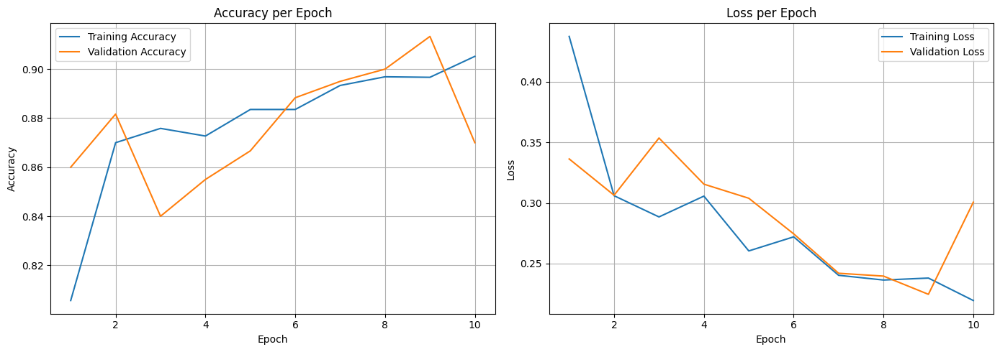

In [ ]:
plot_history(history_10)

In [ ]:
save_history(history_10, "/content/drive/MyDrive/Skripsi/Logs/New2/history_TL_model_10epoch.csv")
model_10.save("/content/drive/MyDrive/Skripsi/Logs/New2/TL_model_10epoch.keras")

History is saved to: /content/drive/MyDrive/Skripsi/Logs/New2/history_TL_model_10epoch.csv


####b. Epoch 20

In [ ]:
model_20 = build_model()
history_20, duration_20 = train_model(model_20, train_data, val_data, epochs=20)

Epoch 1/20
150/150 ━━━━━━━━━━━━━━━━━━━━ 254s 1s/step - accuracy: 0.7198 - loss: 0.7280 - val_accuracy: 0.8317 - val_loss: 0.3626
Epoch 2/20
150/150 ━━━━━━━━━━━━━━━━━━━━ 171s 1s/step - accuracy: 0.8596 - loss: 0.3164 - val_accuracy: 0.8350 - val_loss: 0.3769
Epoch 3/20
150/150 ━━━━━━━━━━━━━━━━━━━━ 170s 1s/step - accuracy: 0.8790 - loss: 0.2887 - val_accuracy: 0.8200 - val_loss: 0.4208
Epoch 4/20
150/150 ━━━━━━━━━━━━━━━━━━━━ 177s 1s/step - accuracy: 0.8848 - loss: 0.2805 - val_accuracy: 0.8983 - val_loss: 0.2585
Epoch 5/20
150/150 ━━━━━━━━━━━━━━━━━━━━ 171s 1s/step - accuracy: 0.8864 - loss: 0.2516 - val_accuracy: 0.8917 - val_loss: 0.2699
Epoch 6/20
150/150 ━━━━━━━━━━━━━━━━━━━━ 171s 1s/step - accuracy: 0.8967 - loss: 0.2476 - val_accuracy: 0.8867 - val_loss: 0.2782
Epoch 7/20
150/150 ━━━━━━━━━━━━━━━━━━━━ 173s 1s/step - accuracy: 0.8962 - loss: 0.2407 - val_accuracy: 0.8783 - val_loss: 0.2840
Epoch 8/20
150/150 ━━━━━━━━━━━━━━━━━━━━ 200s 1s/step - accuracy: 0.8734 - loss: 0.2794 - val_accu

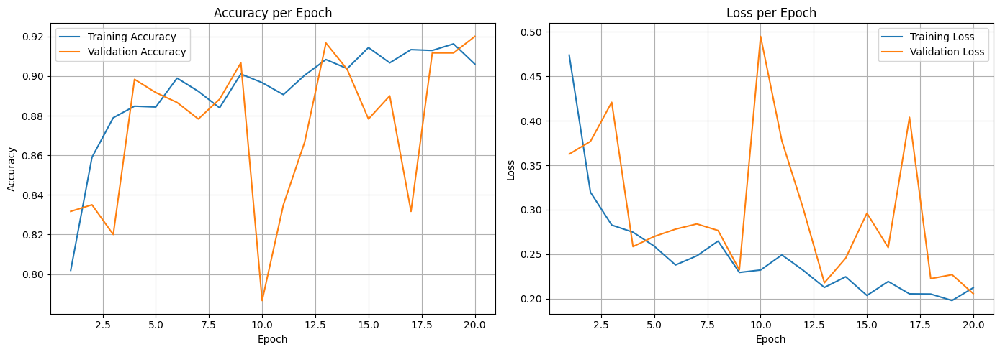

In [ ]:
plot_history(history_20)

In [ ]:
save_history(history_20, "/content/drive/MyDrive/Skripsi/Logs/New2/history_TL_model_20epoch.csv")
model_20.save("/content/drive/MyDrive/Skripsi/Logs/New2/TL_model_20epoch.keras")

History is saved to: /content/drive/MyDrive/Skripsi/Logs/New2/history_TL_model_20epoch.csv


####c. Epoch 30

In [ ]:
model_30 = build_model()
history_30, duration_30 = train_model(model_30, train_data, val_data, epochs=30)

Epoch 1/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 268s 1s/step - accuracy: 0.7138 - loss: 0.7129 - val_accuracy: 0.7900 - val_loss: 0.4351
Epoch 2/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 169s 1s/step - accuracy: 0.8501 - loss: 0.3314 - val_accuracy: 0.8283 - val_loss: 0.4037
Epoch 3/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 171s 1s/step - accuracy: 0.8706 - loss: 0.2986 - val_accuracy: 0.8783 - val_loss: 0.2947
Epoch 4/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 205s 1s/step - accuracy: 0.8707 - loss: 0.2954 - val_accuracy: 0.8967 - val_loss: 0.2547
Epoch 5/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 173s 1s/step - accuracy: 0.8830 - loss: 0.2790 - val_accuracy: 0.8917 - val_loss: 0.2624
Epoch 6/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 172s 1s/step - accuracy: 0.8665 - loss: 0.2897 - val_accuracy: 0.9067 - val_loss: 0.2551
Epoch 7/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 170s 1s/step - accuracy: 0.8894 - loss: 0.2486 - val_accuracy: 0.8900 - val_loss: 0.2535
Epoch 8/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 171s 1s/step - accuracy: 0.8987 - loss: 0.2391 - val_accu

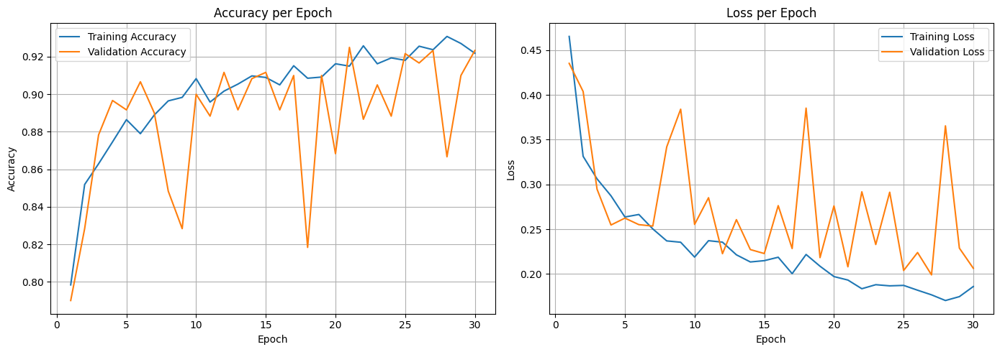

In [ ]:
plot_history(history_30)

In [ ]:
save_history(history_30, "/content/drive/MyDrive/Skripsi/Logs/New2/history_TL_model_30epoch.csv")
model_30.save("/content/drive/MyDrive/Skripsi/Logs/New2/TL_model_30epoch.keras")

History is saved to: /content/drive/MyDrive/Skripsi/Logs/New2/history_TL_model_30epoch.csv


##7.2 Non-Transfer Learning

####a. Epoch 10

In [ ]:
model_10_nonTL = build_model_nonTL()
history_10_nonTL, duration_10_nonTL = train_model(model_10_nonTL, train_data, val_data, epochs=10)

Epoch 1/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 705s 1s/step - accuracy: 0.5760 - loss: 1.1872 - val_accuracy: 0.3333 - val_loss: 42.5367
Epoch 2/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 185s 1s/step - accuracy: 0.7084 - loss: 0.5723 - val_accuracy: 0.3333 - val_loss: 28.0672
Epoch 3/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 185s 1s/step - accuracy: 0.7442 - loss: 0.5228 - val_accuracy: 0.5533 - val_loss: 1.3952
Epoch 4/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 186s 1s/step - accuracy: 0.7736 - loss: 0.4873 - val_accuracy: 0.7417 - val_loss: 0.6156
Epoch 5/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 187s 1s/step - accuracy: 0.8003 - loss: 0.4401 - val_accuracy: 0.3333 - val_loss: 10.2024
Epoch 6/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 193s 1s/step - accuracy: 0.8345 - loss: 0.3629 - val_accuracy: 0.3333 - val_loss: 12.4621
Epoch 7/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 185s 1s/step - accuracy: 0.8507 - loss: 0.3520 - val_accuracy: 0.3367 - val_loss: 6.8505
Epoch 8/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 187s 1s/step - accuracy: 0.8417 - loss: 0.3632 - val_

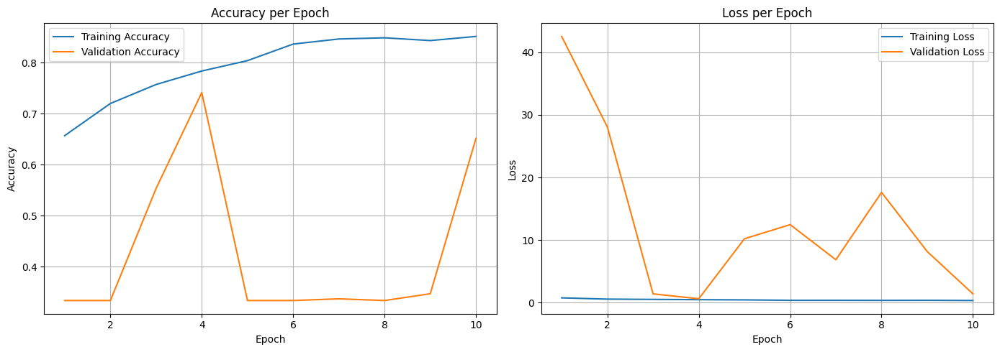

In [ ]:
plot_history(history_10_nonTL)

In [ ]:
save_history(history_10_nonTL, "/content/drive/MyDrive/Skripsi/Logs/New2/history_nonTL_model_10epoch(2).csv")
model_10_nonTL.save("/content/drive/MyDrive/Skripsi/Logs/New2/nonTL_model_10epoch(2).keras")

History is saved to: /content/drive/MyDrive/Skripsi/Logs/New2/history_nonTL_model_10epoch(2).csv


####b. Epoch 20

In [ ]:
model_20_nonTL = build_model_nonTL()
history_20_nonTL, duration_20_nonTL = train_model(model_20_nonTL, train_data, val_data, epochs=20)

Epoch 1/20
150/150 ━━━━━━━━━━━━━━━━━━━━ 699s 2s/step - accuracy: 0.5955 - loss: 1.1460 - val_accuracy: 0.3500 - val_loss: 48.3178
Epoch 2/20
150/150 ━━━━━━━━━━━━━━━━━━━━ 192s 1s/step - accuracy: 0.7262 - loss: 0.5671 - val_accuracy: 0.3333 - val_loss: 31.3116
Epoch 3/20
150/150 ━━━━━━━━━━━━━━━━━━━━ 185s 1s/step - accuracy: 0.7736 - loss: 0.4847 - val_accuracy: 0.4183 - val_loss: 2.9121
Epoch 4/20
150/150 ━━━━━━━━━━━━━━━━━━━━ 188s 1s/step - accuracy: 0.7992 - loss: 0.4814 - val_accuracy: 0.3350 - val_loss: 13.6065
Epoch 5/20
150/150 ━━━━━━━━━━━━━━━━━━━━ 185s 1s/step - accuracy: 0.8202 - loss: 0.4105 - val_accuracy: 0.5633 - val_loss: 1.9399
Epoch 6/20
150/150 ━━━━━━━━━━━━━━━━━━━━ 189s 1s/step - accuracy: 0.8257 - loss: 0.3968 - val_accuracy: 0.6483 - val_loss: 1.5253
Epoch 7/20
150/150 ━━━━━━━━━━━━━━━━━━━━ 187s 1s/step - accuracy: 0.8386 - loss: 0.3714 - val_accuracy: 0.3783 - val_loss: 8.0585
Epoch 8/20
150/150 ━━━━━━━━━━━━━━━━━━━━ 186s 1s/step - accuracy: 0.8237 - loss: 0.3750 - val_a

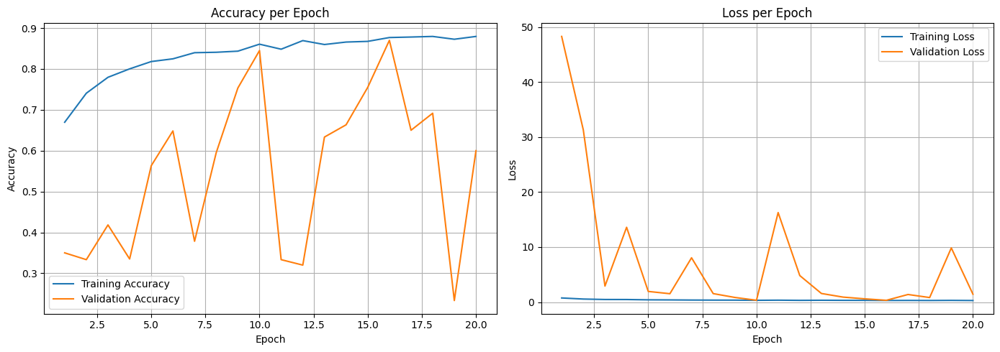

In [ ]:
plot_history(history_20_nonTL)

In [ ]:
save_history(history_20_nonTL, "/content/drive/MyDrive/Skripsi/Logs/New2/history_nonTL_model_20epoch(2).csv")
model_20_nonTL.save("/content/drive/MyDrive/Skripsi/Logs/New2/nonTL_model_20epoch(2).keras")

History is saved to: /content/drive/MyDrive/Skripsi/Logs/New2/history_nonTL_model_20epoch(2).csv


####c. Epoch 30

In [ ]:
model_30_nonTL = build_model_nonTL()
history_30_nonTL, duration_30_nonTL = train_model(model_30_nonTL, train_data, val_data, epochs=30)

Epoch 1/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 748s 2s/step - accuracy: 0.5610 - loss: 1.1069 - val_accuracy: 0.3317 - val_loss: 32.6655
Epoch 2/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 189s 1s/step - accuracy: 0.6783 - loss: 0.6378 - val_accuracy: 0.3333 - val_loss: 34.2993
Epoch 3/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 203s 1s/step - accuracy: 0.7342 - loss: 0.5379 - val_accuracy: 0.3333 - val_loss: 9.1118
Epoch 4/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 190s 1s/step - accuracy: 0.7676 - loss: 0.4917 - val_accuracy: 0.2467 - val_loss: 5.6005
Epoch 5/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 188s 1s/step - accuracy: 0.8027 - loss: 0.4318 - val_accuracy: 0.4650 - val_loss: 3.7769
Epoch 6/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 187s 1s/step - accuracy: 0.7952 - loss: 0.4341 - val_accuracy: 0.3333 - val_loss: 23.7525
Epoch 7/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 187s 1s/step - accuracy: 0.8233 - loss: 0.4005 - val_accuracy: 0.6767 - val_loss: 1.0081
Epoch 8/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 187s 1s/step - accuracy: 0.8479 - loss: 0.3758 - val_a

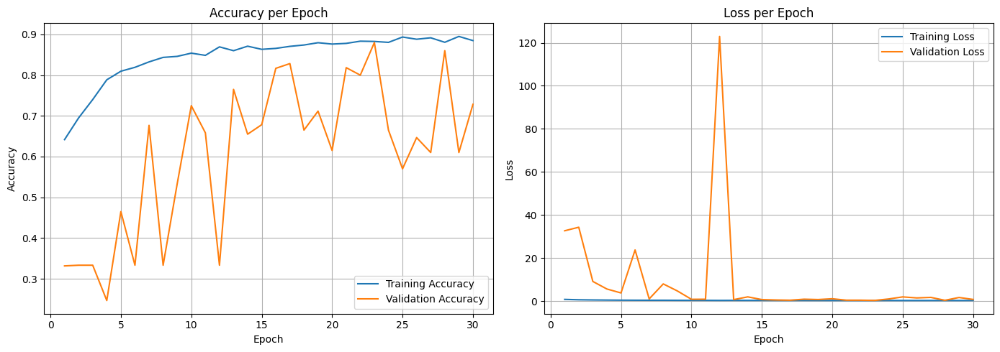

In [ ]:
plot_history(history_30_nonTL)

In [ ]:
save_history(history_30_nonTL, "/content/drive/MyDrive/Skripsi/Logs/New2/history_nonTL_model_30epoch(2).csv")
model_30_nonTL.save("/content/drive/MyDrive/Skripsi/Logs/New2/nonTL_model_30epoch(2).keras")

History is saved to: /content/drive/MyDrive/Skripsi/Logs/New2/history_nonTL_model_30epoch(2).csv


# Fine-tuning

In [ ]:
model = load_model('/content/drive/MyDrive/Skripsi/Logs/New2/TL_model_30epoch.keras')

for layer in model.layers:
    layer.trainable = False

for layer in model.layers:
    if layer.name.startswith('conv5_block'):
        if isinstance(layer, BatchNormalization):
            layer.trainable = False
        else:
            layer.trainable = True

for layer in model.layers:
    if isinstance(layer, Dense):
        layer.trainable = True

trainable = [l.name for l in model.layers if l.trainable]
print("Trainable layers:", len(trainable))
trainable

Trainable layers: 162


['conv5_block1_0_relu',
 'conv5_block1_1_conv',
 'conv5_block1_1_relu',
 'conv5_block1_2_conv',
 'conv5_block1_concat',
 'conv5_block2_0_relu',
 'conv5_block2_1_conv',
 'conv5_block2_1_relu',
 'conv5_block2_2_conv',
 'conv5_block2_concat',
 'conv5_block3_0_relu',
 'conv5_block3_1_conv',
 'conv5_block3_1_relu',
 'conv5_block3_2_conv',
 'conv5_block3_concat',
 'conv5_block4_0_relu',
 'conv5_block4_1_conv',
 'conv5_block4_1_relu',
 'conv5_block4_2_conv',
 'conv5_block4_concat',
 'conv5_block5_0_relu',
 'conv5_block5_1_conv',
 'conv5_block5_1_relu',
 'conv5_block5_2_conv',
 'conv5_block5_concat',
 'conv5_block6_0_relu',
 'conv5_block6_1_conv',
 'conv5_block6_1_relu',
 'conv5_block6_2_conv',
 'conv5_block6_concat',
 'conv5_block7_0_relu',
 'conv5_block7_1_conv',
 'conv5_block7_1_relu',
 'conv5_block7_2_conv',
 'conv5_block7_concat',
 'conv5_block8_0_relu',
 'conv5_block8_1_conv',
 'conv5_block8_1_relu',
 'conv5_block8_2_conv',
 'conv5_block8_concat',
 'conv5_block9_0_relu',
 'conv5_block9_1

In [ ]:
for i, layer in enumerate(model.layers):
    if isinstance(layer, BatchNormalization) or "batch_normalization" in layer.name or "bn" in layer.name:
        print(f"{i:3d} | {layer.name:35s} | trainable={layer.trainable}")

  3 | conv1_bn                            | trainable=False
  7 | conv2_block1_0_bn                   | trainable=False
 10 | conv2_block1_1_bn                   | trainable=False
 14 | conv2_block2_0_bn                   | trainable=False
 17 | conv2_block2_1_bn                   | trainable=False
 21 | conv2_block3_0_bn                   | trainable=False
 24 | conv2_block3_1_bn                   | trainable=False
 28 | conv2_block4_0_bn                   | trainable=False
 31 | conv2_block4_1_bn                   | trainable=False
 35 | conv2_block5_0_bn                   | trainable=False
 38 | conv2_block5_1_bn                   | trainable=False
 42 | conv2_block6_0_bn                   | trainable=False
 45 | conv2_block6_1_bn                   | trainable=False
 49 | pool2_bn                            | trainable=False
 53 | conv3_block1_0_bn                   | trainable=False
 56 | conv3_block1_1_bn                   | trainable=False
 60 | conv3_block2_0_bn                 

In [ ]:
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss=CategoricalCrossentropy(),
              metrics=['accuracy'])

history_ft_block = model.fit(
    train_data,
    validation_data=val_data,
    epochs=10,
)

Epoch 1/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 278s 1s/step - accuracy: 0.8354 - loss: 0.4941 - val_accuracy: 0.9117 - val_loss: 0.2391
Epoch 2/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 171s 1s/step - accuracy: 0.9178 - loss: 0.1918 - val_accuracy: 0.9017 - val_loss: 0.2342
Epoch 3/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 175s 1s/step - accuracy: 0.9220 - loss: 0.1895 - val_accuracy: 0.9083 - val_loss: 0.2159
Epoch 4/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 176s 1s/step - accuracy: 0.9221 - loss: 0.1833 - val_accuracy: 0.9250 - val_loss: 0.1841
Epoch 5/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 179s 1s/step - accuracy: 0.9435 - loss: 0.1594 - val_accuracy: 0.8967 - val_loss: 0.2461
Epoch 6/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 175s 1s/step - accuracy: 0.9364 - loss: 0.1538 - val_accuracy: 0.9133 - val_loss: 0.2129
Epoch 7/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 173s 1s/step - accuracy: 0.9312 - loss: 0.1734 - val_accuracy: 0.9367 - val_loss: 0.1797
Epoch 8/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 184s 1s/step - accuracy: 0.9400 - loss: 0.1526 - val_accu

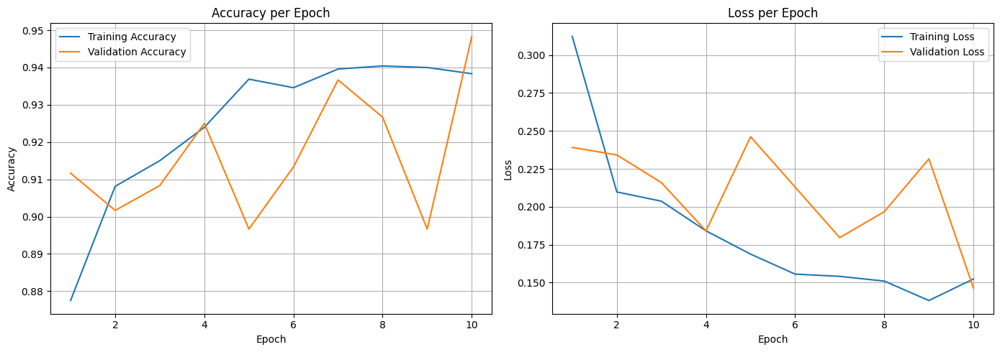

In [ ]:
plot_history(history_ft_block)

In [ ]:
save_history(history_ft_block, "/content/drive/MyDrive/Skripsi/Logs/New2/history_model_ft_DB4.csv")
model.save('/content/drive/MyDrive/Skripsi/Logs/New2/model_ft_DB4.keras')

History is saved to: /content/drive/MyDrive/Skripsi/Logs/New2/history_model_ft_DB4.csv


Non Aug

In [ ]:
model = load_model('/content/drive/MyDrive/Skripsi/Logs/New/TL_model_30epoch.keras')

for layer in model.layers:
    layer.trainable = False

for layer in model.layers:
    if layer.name.startswith('conv5_block'):
        if isinstance(layer, BatchNormalization):
            layer.trainable = False
        else:
            layer.trainable = True

for layer in model.layers:
    if isinstance(layer, Dense):
        layer.trainable = True

trainable = [l.name for l in model.layers if l.trainable]
print("Trainable layers:", len(trainable))
trainable

Trainable layers: 162


['conv5_block1_0_relu',
 'conv5_block1_1_conv',
 'conv5_block1_1_relu',
 'conv5_block1_2_conv',
 'conv5_block1_concat',
 'conv5_block2_0_relu',
 'conv5_block2_1_conv',
 'conv5_block2_1_relu',
 'conv5_block2_2_conv',
 'conv5_block2_concat',
 'conv5_block3_0_relu',
 'conv5_block3_1_conv',
 'conv5_block3_1_relu',
 'conv5_block3_2_conv',
 'conv5_block3_concat',
 'conv5_block4_0_relu',
 'conv5_block4_1_conv',
 'conv5_block4_1_relu',
 'conv5_block4_2_conv',
 'conv5_block4_concat',
 'conv5_block5_0_relu',
 'conv5_block5_1_conv',
 'conv5_block5_1_relu',
 'conv5_block5_2_conv',
 'conv5_block5_concat',
 'conv5_block6_0_relu',
 'conv5_block6_1_conv',
 'conv5_block6_1_relu',
 'conv5_block6_2_conv',
 'conv5_block6_concat',
 'conv5_block7_0_relu',
 'conv5_block7_1_conv',
 'conv5_block7_1_relu',
 'conv5_block7_2_conv',
 'conv5_block7_concat',
 'conv5_block8_0_relu',
 'conv5_block8_1_conv',
 'conv5_block8_1_relu',
 'conv5_block8_2_conv',
 'conv5_block8_concat',
 'conv5_block9_0_relu',
 'conv5_block9_1

In [ ]:
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss=CategoricalCrossentropy(),
              metrics=['accuracy'])

history_ft_block = model.fit(
    train_data,
    validation_data=val_data,
    epochs=10,
)

Epoch 1/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 255s 1s/step - accuracy: 0.8593 - loss: 0.5098 - val_accuracy: 0.9200 - val_loss: 0.2429
Epoch 2/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 126s 837ms/step - accuracy: 0.9614 - loss: 0.1017 - val_accuracy: 0.9033 - val_loss: 0.2904
Epoch 3/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 123s 818ms/step - accuracy: 0.9650 - loss: 0.0946 - val_accuracy: 0.9200 - val_loss: 0.2270
Epoch 4/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 123s 817ms/step - accuracy: 0.9730 - loss: 0.0713 - val_accuracy: 0.9350 - val_loss: 0.2037
Epoch 5/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 141s 814ms/step - accuracy: 0.9828 - loss: 0.0485 - val_accuracy: 0.9400 - val_loss: 0.1987
Epoch 6/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 123s 821ms/step - accuracy: 0.9933 - loss: 0.0266 - val_accuracy: 0.9600 - val_loss: 0.1655
Epoch 7/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 123s 820ms/step - accuracy: 0.9848 - loss: 0.0419 - val_accuracy: 0.9417 - val_loss: 0.2070
Epoch 8/10
150/150 ━━━━━━━━━━━━━━━━━━━━ 125s 832ms/step - accuracy: 0.9856 - lo

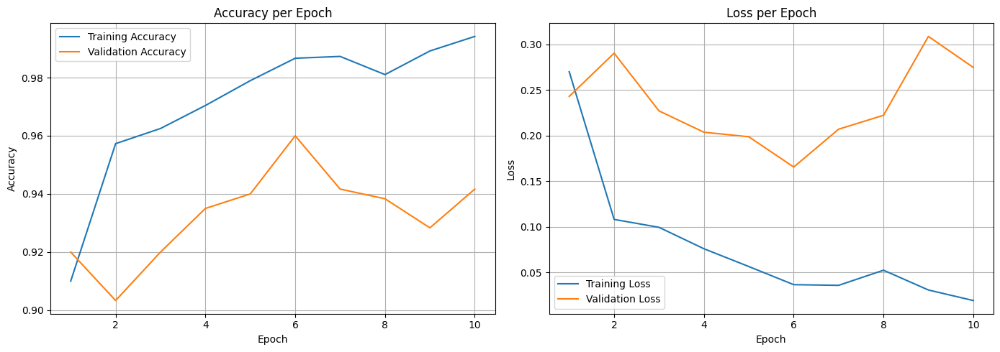

In [ ]:
plot_history(history_ft_block)

In [ ]:
save_history(history_ft_block, "/content/drive/MyDrive/Skripsi/Logs/New2/history_model_ft_nonaug_DB4.csv")
model.save('/content/drive/MyDrive/Skripsi/Logs/New2/model_ft_nonaug_DB4.keras')

History is saved to: /content/drive/MyDrive/Skripsi/Logs/New2/history_model_ft_nonaug_DB4.csv


In [ ]:
# class DummyHistory:
#     def __init__(self, history_dict):
#         self.history = history_dict

In [ ]:
# import matplotlib.pyplot as plt
# from matplotlib.ticker import FuncFormatter

# def plot_history(history):
#     if not hasattr(history, 'history'):
#         print("History object is invalid.")
#         return

#     # Atur font default sekali saja
#     plt.rcParams["font.family"] = "serif"

#     acc = history.history.get('accuracy', [])
#     val_acc = history.history.get('val_accuracy', [])
#     loss = history.history.get('loss', [])
#     val_loss = history.history.get('val_loss', [])
#     epochs = range(1, len(acc) + 1)

#     title_font = {'fontsize': 22}
#     label_font = {'fontsize': 20}
#     legend_font = {'size': 20}
#     tick_fontsize = 20

#     def format_ticks(x, _):
#         return f'{x:.2f}'.rstrip('0').rstrip('.') if x != int(x) else str(int(x))

#     formatter = FuncFormatter(format_ticks)

#     # Figure untuk Accuracy
#     plt.figure(figsize=(8, 6))
#     plt.plot(epochs, acc, label='Training', linewidth=3)
#     plt.plot(epochs, val_acc, label='Validation', linewidth=3)
#     plt.title('Accuracy', **title_font)
#     plt.xlabel('Epoch', **label_font)
#     plt.ylabel('Accuracy', **label_font)
#     plt.xticks(fontsize=tick_fontsize)
#     plt.yticks(fontsize=tick_fontsize)
#     plt.gca().xaxis.set_major_formatter(formatter)
#     plt.gca().yaxis.set_major_formatter(formatter)
#     plt.legend(prop=legend_font, loc='upper left')
#     plt.grid(True)
#     plt.tight_layout()
#     plt.show()

#     # Figure untuk Loss
#     plt.figure(figsize=(8, 6))
#     plt.plot(epochs, loss, label='Training', linewidth=3)
#     plt.plot(epochs, val_loss, label='Validation', linewidth=3)
#     plt.title('Loss', **title_font)
#     plt.xlabel('Epoch', **label_font)
#     plt.ylabel('Loss', **label_font)
#     plt.xticks(fontsize=tick_fontsize)
#     plt.yticks(fontsize=tick_fontsize)
#     plt.gca().xaxis.set_major_formatter(formatter)
#     plt.gca().yaxis.set_major_formatter(formatter)
#     plt.legend(prop=legend_font, loc='upper right')
#     plt.grid(True)
#     plt.tight_layout()
#     plt.show()


In [ ]:
# df = pd.read_csv("/content/drive/MyDrive/Skripsi/Logs/New2/history_model_ft_DB4.csv")

# history_dict = df.to_dict(orient='list')
# viz = DummyHistory(history_dict)

# plot_history(viz)

#8.&nbsp;Evaluation

As we can see based on training hostory above, that shown the best model in both method is at 30 epoch, so only 2 of them will be used to  go further as evaluating use confusion mtx and classiifier report

##8.1&nbsp;Confusion Matrix

In [ ]:
def plot_confusion_matrix(model, test_data = test_data):
    Y_pred = model.predict(test_data)
    y_pred = np.argmax(Y_pred, axis=1)
    confusion_mtx = confusion_matrix(test_data.classes, y_pred)

    f, ax = plt.subplots(figsize=(8, 6))
    sns.heatmap(
        confusion_mtx,
        annot=True,
        linewidths=0.5,
        linecolor="white",
        fmt='d',
        cmap='Blues',
        ax=ax,
        annot_kws={"size": 12}
    )

    plt.xlabel("Predicted Label", fontsize=12)
    plt.ylabel("True Label", fontsize=12)
    plt.title("Confusion Matrix", fontsize=14)

    class_names = list(test_data.class_indices.keys())
    ax.xaxis.set_ticklabels(class_names, fontsize=12, rotation=45)
    ax.yaxis.set_ticklabels(class_names, fontsize=12, rotation=0)
    plt.show()

In [ ]:
# def plot_confusion_matrix(model, test_data=test_data):
#     Y_pred = model.predict(test_data)
#     y_pred = np.argmax(Y_pred, axis=1)
#     confusion_mtx = confusion_matrix(test_data.classes, y_pred)

#     f, ax = plt.subplots(figsize=(8, 6))
#     sns.heatmap(
#         confusion_mtx,
#         annot=True,
#         linewidths=0.5,
#         linecolor="white",
#         fmt='d',
#         cmap='Blues',
#         ax=ax,
#         annot_kws={"size": 18}   # angka di dalam kotak
#     )

#     plt.xlabel("Predicted Label", fontsize=20)
#     plt.ylabel("True Label", fontsize=20)
#     plt.title("Confusion Matrix", fontsize=22)

#     class_names = list(test_data.class_indices.keys())
#     ax.xaxis.set_ticklabels(class_names, fontsize=20, rotation=45)
#     ax.yaxis.set_ticklabels(class_names, fontsize=20, rotation=0)

#     plt.show()


###8.1.1 Transfer Learning

19/19 ━━━━━━━━━━━━━━━━━━━━ 72s 3s/step


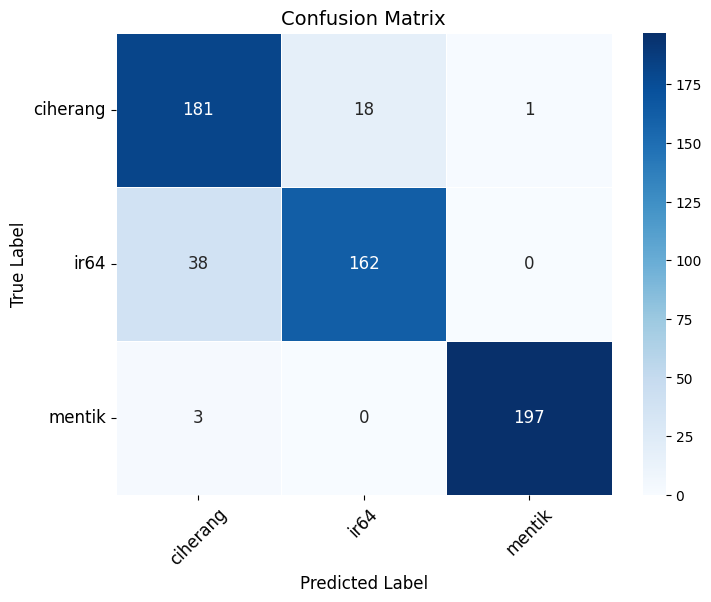

In [ ]:
model_30 = load_model('/content/drive/MyDrive/Skripsi/Logs/New2/TL_model_30epoch.keras')
plot_confusion_matrix(model_30)

###8.1.1 Non-Transfer Learning

19/19 ━━━━━━━━━━━━━━━━━━━━ 69s 2s/step


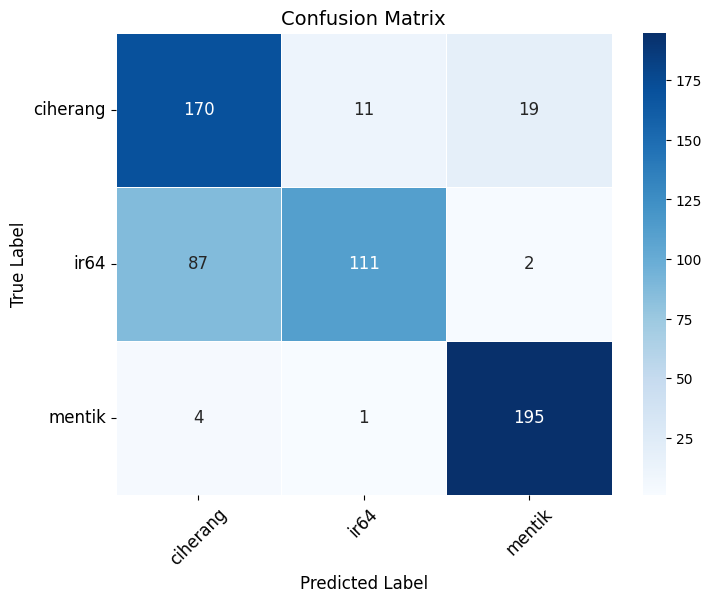

In [ ]:
model_20_nonTL = load_model('/content/drive/MyDrive/Skripsi/Logs/New2/nonTL_model_20epoch.keras')
plot_confusion_matrix(model_20_nonTL)

### Fine-Tuned

In [ ]:
FT_aug = load_model("/content/drive/MyDrive/Skripsi/Logs/New2/model_ft_DB4.keras")
FT_noaug = load_model("/content/drive/MyDrive/Skripsi/Logs/New2/model_ft_nonaug_DB4.keras")

19/19 ━━━━━━━━━━━━━━━━━━━━ 77s 3s/step


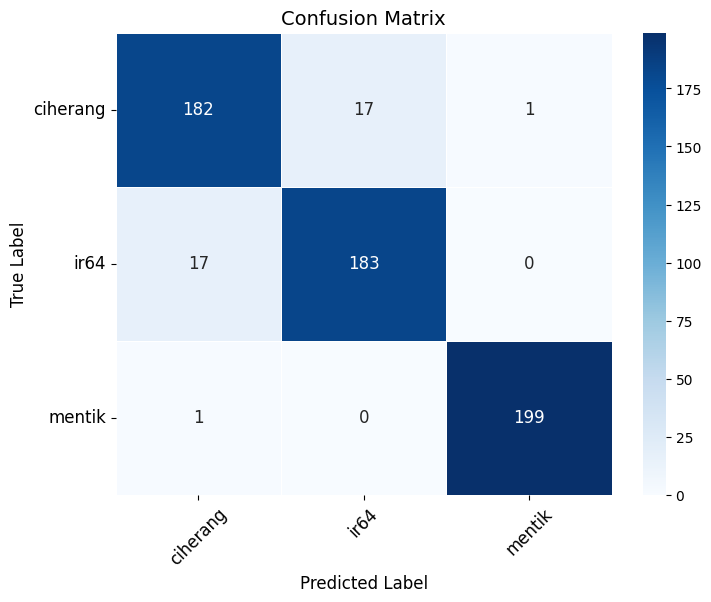

In [ ]:
plot_confusion_matrix(FT_aug)

19/19 ━━━━━━━━━━━━━━━━━━━━ 71s 2s/step


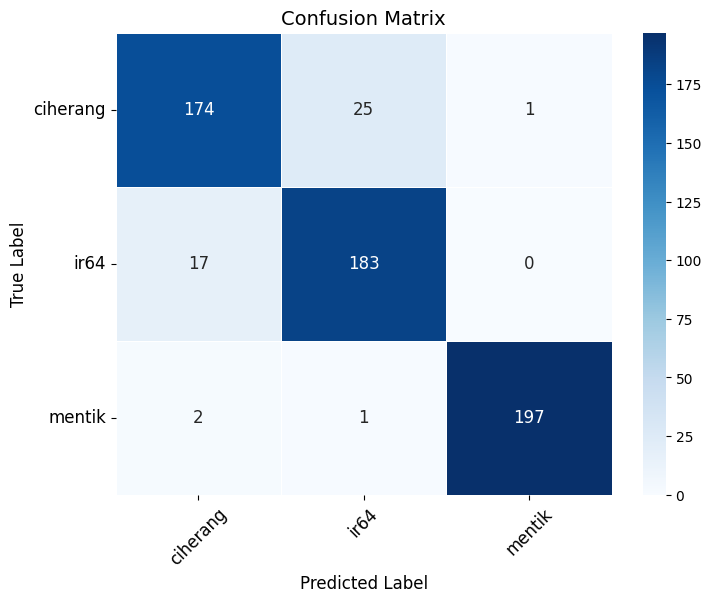

In [ ]:
plot_confusion_matrix(FT_noaug)

##8.2&nbsp;Classification Report

In [ ]:
def evaluate_model(model, test_data = test_data):
    Y_pred = model.predict(test_data)
    y_pred = np.argmax(Y_pred, axis=1)
    y_true = test_data.classes

    class_labels = list(test_data.class_indices.keys())
    report = classification_report(y_true, y_pred, target_names=class_labels)
    print("\nClassification Report:")
    print(report)

###8.2.1 Transfer Learning

In [ ]:
evaluate_model(model_30)

19/19 ━━━━━━━━━━━━━━━━━━━━ 14s 709ms/step

Classification Report:
              precision    recall  f1-score   support

    ciherang       0.82      0.91      0.86       200
        ir64       0.90      0.81      0.85       200
      mentik       0.99      0.98      0.99       200

    accuracy                           0.90       600
   macro avg       0.90      0.90      0.90       600
weighted avg       0.90      0.90      0.90       600



###8.2.1 Non-Transfer Learning

In [ ]:
evaluate_model(model_20_nonTL)

19/19 ━━━━━━━━━━━━━━━━━━━━ 13s 688ms/step

Classification Report:
              precision    recall  f1-score   support

    ciherang       0.65      0.85      0.74       200
        ir64       0.90      0.56      0.69       200
      mentik       0.90      0.97      0.94       200

    accuracy                           0.79       600
   macro avg       0.82      0.79      0.79       600
weighted avg       0.82      0.79      0.79       600



### Fine-Tuned

In [ ]:
evaluate_model(FT_aug)

19/19 ━━━━━━━━━━━━━━━━━━━━ 14s 710ms/step

Classification Report:
              precision    recall  f1-score   support

    ciherang       0.91      0.91      0.91       200
        ir64       0.92      0.92      0.92       200
      mentik       0.99      0.99      0.99       200

    accuracy                           0.94       600
   macro avg       0.94      0.94      0.94       600
weighted avg       0.94      0.94      0.94       600



In [ ]:
evaluate_model(FT_noaug)

19/19 ━━━━━━━━━━━━━━━━━━━━ 14s 724ms/step

Classification Report:
              precision    recall  f1-score   support

    ciherang       0.90      0.87      0.89       200
        ir64       0.88      0.92      0.89       200
      mentik       0.99      0.98      0.99       200

    accuracy                           0.92       600
   macro avg       0.92      0.92      0.92       600
weighted avg       0.92      0.92      0.92       600



# Benchmarking

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import (
    ResNet50, VGG16, MobileNetV2, EfficientNetB3
)

def build_model_benchmark(backbone, input_shape=(224,224,3), num_classes=3):
    base_benchmark = backbone(weights='imagenet', include_top=False, input_shape=input_shape)
    base_benchmark.trainable = False

    x = base_benchmark.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_benchmark.input, outputs=predictions)
    return model

In [ ]:
model_resnet = build_model_benchmark(ResNet50)
model_vgg = build_model_benchmark(VGG16)
model_mobilenet = build_model_benchmark(MobileNetV2)
model_effnet = build_model_benchmark(EfficientNetB3)

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step
9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
43941136/43941136 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


## ResNet-50

In [ ]:
history_30_resnet, duration_30 = train_model(model_resnet, train_data, val_data, epochs=30)

Epoch 1/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 209s 1s/step - accuracy: 0.4075 - loss: 1.1918 - val_accuracy: 0.6467 - val_loss: 0.8915
Epoch 2/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 183s 1s/step - accuracy: 0.5399 - loss: 0.9420 - val_accuracy: 0.6783 - val_loss: 0.7590
Epoch 3/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 204s 1s/step - accuracy: 0.6213 - loss: 0.8021 - val_accuracy: 0.6633 - val_loss: 0.7566
Epoch 4/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 179s 1s/step - accuracy: 0.6559 - loss: 0.7215 - val_accuracy: 0.7700 - val_loss: 0.5877
Epoch 5/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 179s 1s/step - accuracy: 0.6678 - loss: 0.6680 - val_accuracy: 0.6467 - val_loss: 0.7030
Epoch 6/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 178s 1s/step - accuracy: 0.6503 - loss: 0.6941 - val_accuracy: 0.7400 - val_loss: 0.5766
Epoch 7/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 173s 1s/step - accuracy: 0.6757 - loss: 0.6245 - val_accuracy: 0.7700 - val_loss: 0.5228
Epoch 8/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 175s 1s/step - accuracy: 0.6772 - loss: 0.6338 - val_accu

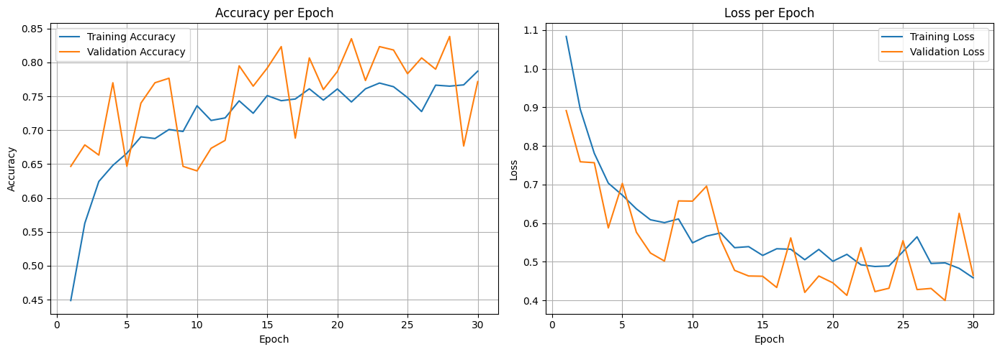

In [ ]:
plot_history(history_30_resnet)

In [ ]:
save_history(history_30_resnet, "/content/drive/MyDrive/Skripsi/Logs/New2/history_model_resnet_30epoch.csv")
model_resnet.save('/content/drive/MyDrive/Skripsi/Logs/New2/model_resnet_30epoch.keras')

History is saved to: /content/drive/MyDrive/Skripsi/Logs/New2/history_model_resnet_30epoch.csv


In [ ]:
model_resnet = load_model("/content/drive/MyDrive/Skripsi/Logs/New2/model_resnet_30epoch.keras")
evaluate_model(model_resnet)

19/19 ━━━━━━━━━━━━━━━━━━━━ 26s 984ms/step

Classification Report:
              precision    recall  f1-score   support

    ciherang       0.65      0.88      0.75       200
        ir64       0.93      0.51      0.66       200
      mentik       0.90      0.99      0.95       200

    accuracy                           0.80       600
   macro avg       0.83      0.80      0.78       600
weighted avg       0.83      0.80      0.78       600



## VGG16

In [ ]:
history_30_vgg, duration_30_vgg = train_model(model_vgg, train_data, val_data, epochs=30)

Epoch 1/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 259s 2s/step - accuracy: 0.5756 - loss: 0.8479 - val_accuracy: 0.7133 - val_loss: 0.5328
Epoch 2/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 214s 1s/step - accuracy: 0.8000 - loss: 0.4699 - val_accuracy: 0.7983 - val_loss: 0.4462
Epoch 3/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 262s 1s/step - accuracy: 0.8217 - loss: 0.4084 - val_accuracy: 0.7817 - val_loss: 0.4358
Epoch 4/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 213s 1s/step - accuracy: 0.8255 - loss: 0.3977 - val_accuracy: 0.8350 - val_loss: 0.3726
Epoch 5/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 262s 1s/step - accuracy: 0.8366 - loss: 0.3740 - val_accuracy: 0.8550 - val_loss: 0.3649
Epoch 6/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 211s 1s/step - accuracy: 0.8382 - loss: 0.3706 - val_accuracy: 0.7817 - val_loss: 0.4367
Epoch 7/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 213s 1s/step - accuracy: 0.8317 - loss: 0.3774 - val_accuracy: 0.7867 - val_loss: 0.4370
Epoch 8/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 211s 1s/step - accuracy: 0.8442 - loss: 0.3496 - val_accu

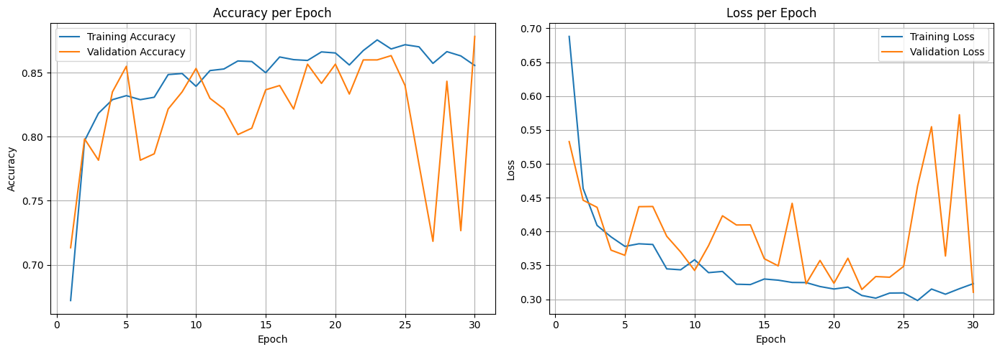

In [ ]:
plot_history(history_30_vgg)

In [ ]:
save_history(history_30_vgg, "/content/drive/MyDrive/Skripsi/Logs/New2/history_model_vgg_30epoch.csv")
model_vgg.save('/content/drive/MyDrive/Skripsi/Logs/New2/model_vgg_30epoch.keras')

History is saved to: /content/drive/MyDrive/Skripsi/Logs/New2/history_model_vgg_30epoch.csv


In [ ]:
model_vgg = load_model("/content/drive/MyDrive/Skripsi/Logs/New2/model_vgg_30epoch.keras")
evaluate_model(model_vgg)

19/19 ━━━━━━━━━━━━━━━━━━━━ 34s 1s/step

Classification Report:
              precision    recall  f1-score   support

    ciherang       0.75      0.78      0.77       200
        ir64       0.80      0.80      0.80       200
      mentik       0.97      0.94      0.95       200

    accuracy                           0.84       600
   macro avg       0.84      0.84      0.84       600
weighted avg       0.84      0.84      0.84       600



## MobileNetV2

In [ ]:
history_30_mobilenet, duration_30_mobilenet = train_model(model_mobilenet, train_data, val_data, epochs=30)

Epoch 1/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 230s 1s/step - accuracy: 0.7265 - loss: 0.6993 - val_accuracy: 0.8417 - val_loss: 0.3699
Epoch 2/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 207s 1s/step - accuracy: 0.8337 - loss: 0.3644 - val_accuracy: 0.8550 - val_loss: 0.3715
Epoch 3/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 206s 1s/step - accuracy: 0.8709 - loss: 0.2975 - val_accuracy: 0.8500 - val_loss: 0.3628
Epoch 4/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 206s 1s/step - accuracy: 0.8670 - loss: 0.2967 - val_accuracy: 0.8650 - val_loss: 0.3248
Epoch 5/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 209s 1s/step - accuracy: 0.8672 - loss: 0.2934 - val_accuracy: 0.8733 - val_loss: 0.3201
Epoch 6/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 210s 1s/step - accuracy: 0.8720 - loss: 0.3025 - val_accuracy: 0.8817 - val_loss: 0.2815
Epoch 7/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 206s 1s/step - accuracy: 0.8843 - loss: 0.2725 - val_accuracy: 0.8533 - val_loss: 0.3489
Epoch 8/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 209s 1s/step - accuracy: 0.8779 - loss: 0.2679 - val_accu

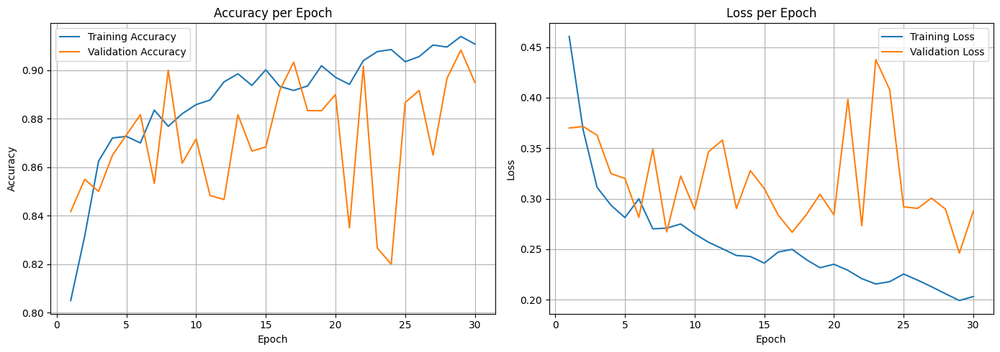

In [ ]:
plot_history(history_30_mobilenet)

In [ ]:
save_history(history_30_mobilenet, "/content/drive/MyDrive/Skripsi/Logs/New2/history_model_mobilenet_30epoch.csv")
model_mobilenet.save('/content/drive/MyDrive/Skripsi/Logs/New2/model_mobilenet_30epoch.keras')

History is saved to: /content/drive/MyDrive/Skripsi/Logs/New2/history_model_mobilenet_30epoch.csv


In [ ]:
model_mobilenet = load_model("/content/drive/MyDrive/Skripsi/Logs/New2/model_mobilenet_30epoch.keras")
evaluate_model(model_mobilenet)

19/19 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step

Classification Report:
              precision    recall  f1-score   support

    ciherang       0.85      0.83      0.84       200
        ir64       0.83      0.88      0.85       200
      mentik       0.99      0.96      0.98       200

    accuracy                           0.89       600
   macro avg       0.89      0.89      0.89       600
weighted avg       0.89      0.89      0.89       600



## EfficientNetB3

In [ ]:
history_30_effnet, duration_30_effnet = train_model(model_effnet, train_data, val_data, epochs=30)

Epoch 1/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 249s 1s/step - accuracy: 0.3327 - loss: 1.2496 - val_accuracy: 0.3333 - val_loss: 1.1124
Epoch 2/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 176s 1s/step - accuracy: 0.3363 - loss: 1.1047 - val_accuracy: 0.3333 - val_loss: 1.0996
Epoch 3/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 173s 1s/step - accuracy: 0.3252 - loss: 1.1019 - val_accuracy: 0.3467 - val_loss: 1.0985
Epoch 4/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 177s 1s/step - accuracy: 0.3357 - loss: 1.0991 - val_accuracy: 0.3333 - val_loss: 1.0986
Epoch 5/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 179s 1s/step - accuracy: 0.3274 - loss: 1.0992 - val_accuracy: 0.3333 - val_loss: 1.0986
Epoch 6/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 176s 1s/step - accuracy: 0.3292 - loss: 1.0988 - val_accuracy: 0.3333 - val_loss: 1.0986
Epoch 7/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 176s 1s/step - accuracy: 0.3244 - loss: 1.0987 - val_accuracy: 0.3333 - val_loss: 1.0986
Epoch 8/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 177s 1s/step - accuracy: 0.3178 - loss: 1.0987 - val_accu

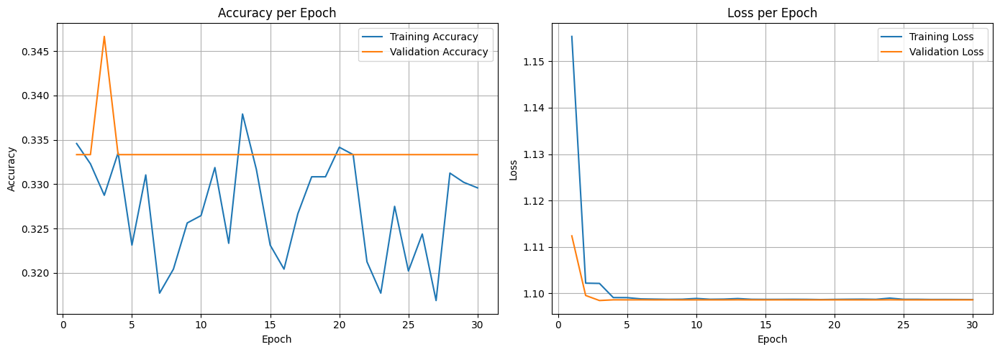

In [ ]:
plot_history(history_30_effnet)

In [ ]:
save_history(history_30_effnet, "/content/drive/MyDrive/Skripsi/Logs/New2/history_model_effnet_30epoch.csv")
model_effnet.save('/content/drive/MyDrive/Skripsi/Logs/New2/model_effnet_30epoch.keras')

History is saved to: /content/drive/MyDrive/Skripsi/Logs/New2/history_model_effnet_30epoch.csv


In [ ]:
model_effnet = load_model("/content/drive/MyDrive/Skripsi/Logs/New2/model_effnet_30epoch.keras")
evaluate_model(model_effnet)

19/19 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step

Classification Report:
              precision    recall  f1-score   support

    ciherang       0.33      1.00      0.50       200
        ir64       0.00      0.00      0.00       200
      mentik       0.00      0.00      0.00       200

    accuracy                           0.33       600
   macro avg       0.11      0.33      0.17       600
weighted avg       0.11      0.33      0.17       600



#Significance Test


Using Cochran's Q Test then McNemar Pairwise

In [ ]:
test_datagen = ImageDataGenerator(rescale=1./255)

test_data = test_datagen.flow_from_directory(
    '/content/dataset/test',
    target_size=(224, 224),
    batch_size=32,
    class_mode="categorical",
    shuffle=False
)

y_true = test_data.classes
class_indices = test_data.class_indices
idx_to_class = {v:k for k,v in class_indices.items()}

Found 600 images belonging to 3 classes.


In [ ]:
def get_predictions(model, generator):
    y_prob = model.predict(generator, verbose=1)
    y_pred = np.argmax(y_prob, axis=1)
    return y_pred

model_paths = {
    "TL_NoAug_30": "/content/drive/MyDrive/Skripsi/Logs/New/TL_model_30epoch.keras",
    "TL_Aug_30": "/content/drive/MyDrive/Skripsi/Logs/New2/TL_model_30epoch.keras",
    "NTL_NoAug_30": "/content/drive/MyDrive/Skripsi/Logs/New/nonTL_model_30epoch.keras",
    "NTL_Aug_30": "/content/drive/MyDrive/Skripsi/Logs/New2/nonTL_model_30epoch(2).keras",
    "FT_Aug": "/content/drive/MyDrive/Skripsi/Logs/New2/model_ft_DB4.keras",
    "FT_NoAug": "/content/drive/MyDrive/Skripsi/Logs/New2/model_ft_nonaug_DB4.keras",
    "ResNet50": "/content/drive/MyDrive/Skripsi/Logs/New2/model_resnet_30epoch.keras",
    "VGG16": "/content/drive/MyDrive/Skripsi/Logs/New2/model_vgg_30epoch.keras",
    "MobileNetV2": "/content/drive/MyDrive/Skripsi/Logs/New2/model_mobilenet_30epoch.keras",
    "EfficientNetB3": "/content/drive/MyDrive/Skripsi/Logs/New2/model_effnet_30epoch.keras",
}

results = {"sample_id": list(range(len(y_true))), "y_true": y_true}

for name, path in model_paths.items():
    model = load_model(path)
    y_pred = get_predictions(model, test_data)
    results[name] = y_pred

df = pd.DataFrame(results)
df.to_csv("prediksi_testset.csv", index=False)
df.head()

19/19 ━━━━━━━━━━━━━━━━━━━━ 74s 2s/step
19/19 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step
19/19 ━━━━━━━━━━━━━━━━━━━━ 61s 2s/step
19/19 ━━━━━━━━━━━━━━━━━━━━ 59s 2s/step
19/19 ━━━━━━━━━━━━━━━━━━━━ 65s 2s/step
19/19 ━━━━━━━━━━━━━━━━━━━━ 62s 2s/step
19/19 ━━━━━━━━━━━━━━━━━━━━ 25s 967ms/step
19/19 ━━━━━━━━━━━━━━━━━━━━ 34s 1s/step
19/19 ━━━━━━━━━━━━━━━━━━━━ 36s 1s/step
19/19 ━━━━━━━━━━━━━━━━━━━━ 49s 2s/step


,sample_id,y_true,TL_NoAug_30,TL_Aug_30,NTL_NoAug_30,NTL_Aug_30,FT_Aug,FT_NoAug,ResNet50,VGG16,MobileNetV2,EfficientNetB3
0,0,0,0,0,0,0,1,0,0,1,0,0
1,1,0,0,0,0,0,0,0,0,0,0,0
2,2,0,0,0,0,0,0,0,2,0,0,0
3,3,0,0,0,0,2,0,0,0,0,0,0
4,4,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
def correctness_matrix(y_true, preds_dict):
    y_true = np.asarray(y_true).astype(int)
    cols = {}
    for name, yhat in preds_dict.items():
        yhat = np.asarray(yhat).astype(int)
        assert len(yhat) == len(y_true), f"Len mismatch for {name}"
        cols[name] = (yhat == y_true).astype(int)
    return pd.DataFrame(cols)

def cochran_q(df_binary):
    X = df_binary.values
    N, k = X.shape
    S = X.sum(axis=0)  # per model
    T = X.sum(axis=1)  # per sample
    num = (k-1) * (k*np.sum(S**2) - (np.sum(S)**2))
    den = k*np.sum(T) - np.sum(T**2)
    Q = num / den if den > 0 else np.nan
    p = chi2.sf(Q, df=k-1)
    return Q, p

def mcnemar_table(a, b):
    a = np.asarray(a).astype(int); b = np.asarray(b).astype(int)
    n10 = int(np.sum((a==1) & (b==0)))
    n01 = int(np.sum((a==0) & (b==1)))
    return n01, n10

def run_family(correct, members, planned_pairs, holm_alpha=0.05):
    out = {}
    # Cochran
    Q, pQ = cochran_q(correct[members])
    out['cochran'] = (Q, pQ)
    # McNemar pairwise
    rows = []
    for A, B in planned_pairs:
        a, b = correct[A].values, correct[B].values
        n01, n10 = mcnemar_table(a, b)
        res = mcnemar([[0, n01],[n10, 0]], exact=(n01+n10<25), correction=(n01+n10>=25))
        rows.append({'Pair': f"{A} vs {B}", 'n01': n01, 'n10': n10, 'p_raw': res.pvalue})
    df = pd.DataFrame(rows)
    _, p_adj, _, _ = multipletests(df['p_raw'], method='holm')
    df['p_Holm'] = p_adj
    df['Significant'] = df['p_Holm'] < holm_alpha
    out['mcnemar'] = df
    return out

def _mcnemar_p(a, b):
    a = np.asarray(a).astype(int); b = np.asarray(b).astype(int)
    n01 = int(np.sum((a==0) & (b==1)))
    n10 = int(np.sum((a==1) & (b==0)))
    res = mcnemar([[0, n01],[n10, 0]], exact=(n01+n10<25), correction=(n01+n10>=25))
    return res.pvalue, n01, n10

def pairwise_matrix(correct_df, members, alpha=0.05, adjust_method='holm', decimals=3, arrow=True):
    k = len(members)
    pairs, pvals, n01s, n10s = [], [], {}, {}
    # p raw -> Nunique
    for i in range(k):
        for j in range(i+1, k):
            A, B = members[i], members[j]
            p_raw, n01, n10 = _mcnemar_p(correct_df[A].values, correct_df[B].values)
            pairs.append((A, B)); pvals.append(p_raw)
            n01s[(A, B)] = n01; n10s[(A, B)] = n10
    # Multitets
    _, p_adj, _, _ = multipletests(pvals, method=adjust_method)
    padj = {pairs[i]: p_adj[i] for i in range(len(pairs))}
    # Matrix interface
    M = pd.DataFrame(index=members, columns=members, dtype=object)
    for A in members:
        for B in members:
            if A == B:
                M.loc[A, B] = "—"
            else:
                key = (A, B) if (A, B) in padj else (B, A)
                p = padj[key]
                sym = ""
                if arrow and p < alpha:
                    if key == (A, B):
                        sym = " ↑" if n10s[key] > n01s[key] else " ←"
                    else:
                        sym = " ↑" if n01s[key] > n10s[key] else " ←"
                M.loc[A, B] = f"{p:.{decimals}g}{sym}"
    return M

def analyze_all_from_csv(csv_path):
    df = pd.read_csv(csv_path)
    df["y_true"] = df["y_true"].astype(int)
    model_cols = [c for c in df.columns if c not in ("sample_id", "y_true", "filename")]
    for c in model_cols:
        df[c] = df[c].astype(int)
    preds = {c: df[c].values for c in model_cols}
    correct = correctness_matrix(df["y_true"].values, preds)

    # Family A
    famA_members = ["TL_Aug_30","TL_NoAug_30","NTL_Aug_30","NTL_NoAug_30","FT_Aug","FT_NoAug"]
    famA_pairs = [
        ("TL_Aug_30","NTL_Aug_30"),
        ("TL_NoAug_30","NTL_NoAug_30"),
        ("TL_Aug_30","TL_NoAug_30"),
        ("FT_Aug","TL_Aug_30"),
        ("FT_NoAug","TL_NoAug_30"),
        ("FT_Aug","FT_NoAug"),
    ]
    resA = run_family(correct, famA_members, famA_pairs, holm_alpha=0.05)
    M_A  = pairwise_matrix(correct, famA_members, alpha=0.05, adjust_method='holm', decimals=3, arrow=True)
    print("Family A Cochran Q, p:", resA['cochran'])

    # Family B
    famB_members = ["FT_Aug","ResNet50","VGG16","MobileNetV2","EfficientNetB3"]
    famB_pairs = [
        ("FT_Aug","ResNet50"),
        ("FT_Aug","VGG16"),
        ("FT_Aug","MobileNetV2"),
        ("FT_Aug","EfficientNetB3"),
    ]
    resB = run_family(correct, famB_members, famB_pairs, holm_alpha=0.05)
    M_B  = pairwise_matrix(correct, famB_members, alpha=0.05, adjust_method='holm', decimals=3, arrow=True)
    print("Family B Cochran Q, p:", resB['cochran'])

    # Save
    resA['mcnemar'].to_csv("FamilyA_McNemar_Holm.csv", index=False)
    resB['mcnemar'].to_csv("FamilyB_McNemar_Holm.csv", index=False)
    M_A.to_csv("FamilyA_McNemar_Matrix.csv")
    M_B.to_csv("FamilyB_McNemar_Matrix.csv")
    print("[Saved] FamilyA_McNemar_Holm.csv, FamilyB_McNemar_Holm.csv")
    print("[Saved] FamilyA_McNemar_Matrix.csv, FamilyB_McNemar_Matrix.csv")

    return resA, resB, M_A, M_B

In [ ]:
resA, resB, M_A, M_B = analyze_all_from_csv("prediksi_testset.csv")

Family A Cochran Q, p: (np.float64(273.0623755806238), np.float64(6.155066017700134e-57))
Family B Cochran Q, p: (np.float64(792.0110599078341), np.float64(4.1283840739277375e-170))
[Saved] FamilyA_McNemar_Holm.csv, FamilyB_McNemar_Holm.csv
[Saved] FamilyA_McNemar_Matrix.csv, FamilyB_McNemar_Matrix.csv


#9.&nbsp;Result & Analysis

Analysis based on what we found

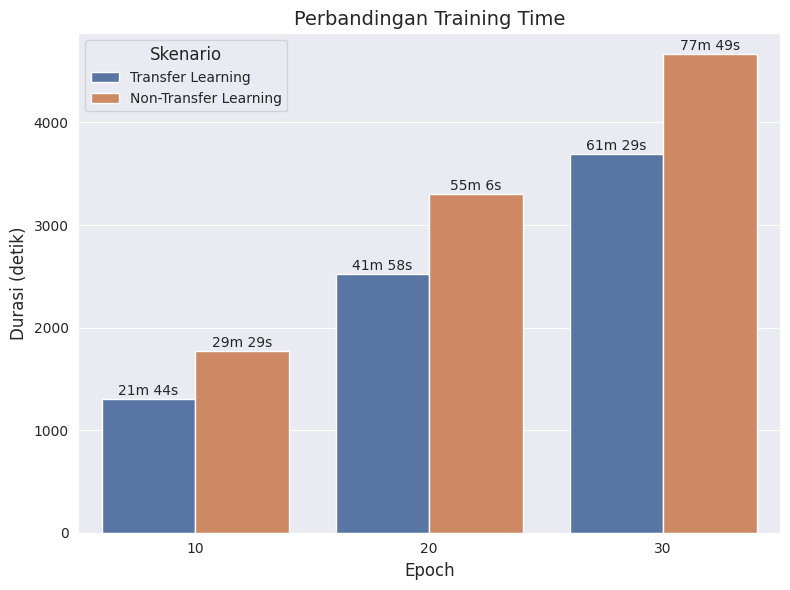

In [ ]:
data = {
    "Skenario": ["Transfer Learning", "Transfer Learning", "Transfer Learning", "Non-Transfer Learning", "Non-Transfer Learning", "Non-Transfer Learning"],
    "Epoch": [10, 20, 30, 10, 20, 30],
    "Durasi": [21 * 60 + 44, 41 * 60 + 58, 61 * 60 + 29, 29 * 60 + 29, 55 * 60 + 6, 77 * 60 + 49]
}
df = pd.DataFrame(data)

sns.set_style("darkgrid")
plt.figure(figsize=(8, 6))
barplot = sns.barplot(data=df, x="Epoch", y="Durasi", hue="Skenario", palette="deep")

plt.title("Perbandingan Training Time", fontsize=14)
plt.xlabel("Epoch", fontsize=12)
plt.ylabel("Durasi (detik)", fontsize=12)

max_duration = max(df["Durasi"])
plt.ylim(0, max_duration + 200)

def format_duration(seconds):
    minutes = seconds // 60
    seconds = seconds % 60
    return f"{minutes}m {seconds}s"

for container, scenario in zip(barplot.containers, df["Skenario"].unique()):
    scenario_data = df[df["Skenario"] == scenario]
    for bar, duration in zip(container, scenario_data["Durasi"]):
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height() + 10,
            format_duration(duration),
            ha='center',
            va='bottom',
            fontsize=10
        )

plt.legend(title="Skenario", fontsize=10, title_fontsize=12)
plt.tight_layout()
plt.show()

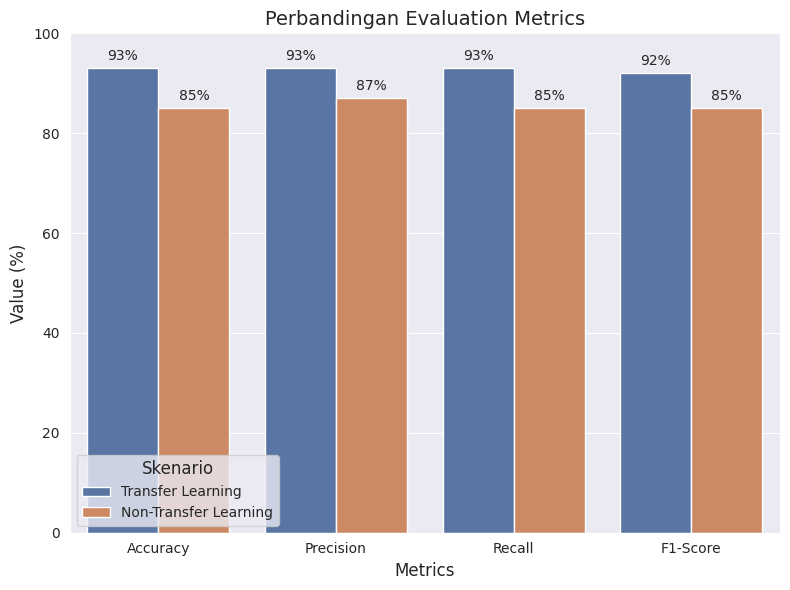

In [ ]:
data = {
    "Skenario": ["Transfer Learning", "Transfer Learning", "Transfer Learning", "Transfer Learning", "Non-Transfer Learning", "Non-Transfer Learning", "Non-Transfer Learning", "Non-Transfer Learning"],
    "Metrik": ["Accuracy", "Precision", "Recall", "F1-Score"] * 2,
    "Nilai": [93, 93, 93, 92, 85, 87, 85, 85]
}

df = pd.DataFrame(data)

plt.figure(figsize=(8, 6))
ax = sns.barplot(data=df, x="Metrik", y="Nilai", hue="Skenario", palette="deep")

plt.title("Perbandingan Evaluation Metrics", fontsize=14)
plt.xlabel("Metrics", fontsize=12)
plt.ylabel("Value (%)", fontsize=12)
plt.ylim(0, 100)

for container in ax.containers:
    for bar in container:
        bar_height = bar.get_height()
        if bar_height > 0:
            ax.text(
                bar.get_x() + bar.get_width() / 2,
                bar_height + 1,
                f"{bar_height:.0f}%",
                ha='center',
                va='bottom',
                fontsize=10
            )

plt.legend(title="Skenario", fontsize=10, title_fontsize=12)
plt.tight_layout()
plt.show()

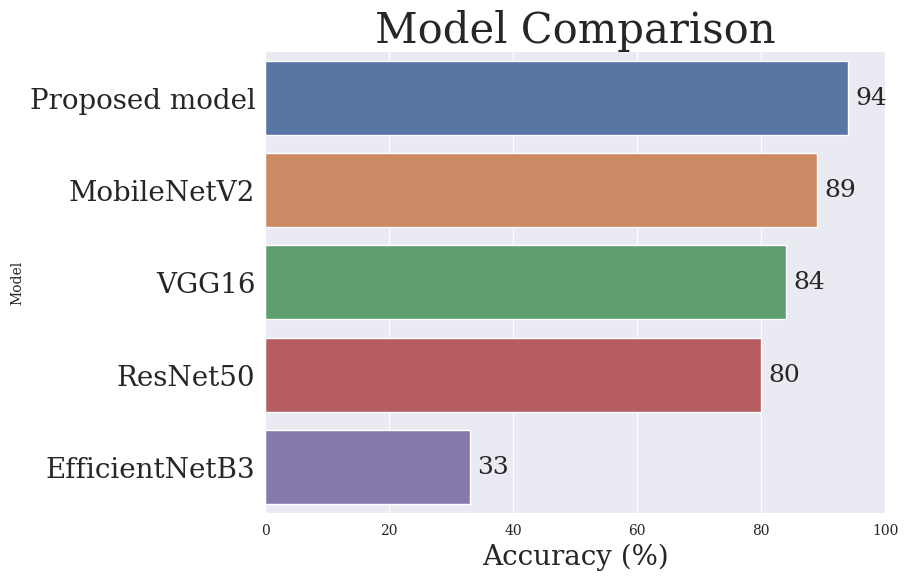

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Data akurasi
data = {
    "Model": ["EfficientNetB3", "ResNet50", "VGG16", "MobileNetV2", "Proposed model"],
    "Accuracy": [33, 80, 84, 89, 94]
}
df = pd.DataFrame(data)

# Urutkan descending
df_sorted = df.sort_values("Accuracy", ascending=False)

# Set style seaborn
sns.set_style('darkgrid')
plt.rcParams["font.family"] = "serif"

# Plot horizontal urut desc
plt.figure(figsize=(8,6))
barplot = sns.barplot(
    data=df_sorted,
    x="Accuracy",
    y="Model",
    palette="deep",
    hue="Model",
    dodge=False
)

# Tambahkan nilai akurasi di samping bar
for p in barplot.patches:
    barplot.annotate(f'{p.get_width():.0f}',
                     (p.get_width(), p.get_y() + p.get_height() / 2.),
                     ha='left', va='center', fontsize=18,
                     xytext=(5,0), textcoords='offset points')

# Atur sumbu & judul
plt.xlim(0, 100)
plt.xlabel("Accuracy (%)", fontsize=20)
plt.title("Model Comparison", fontsize=30)
plt.yticks(fontsize=20)

plt.show()


In [ ]:
# Inference Speed benchmark
import os, time, statistics, numpy as np, tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image_dataset_from_directory

MODEL_PATH = "/content/drive/MyDrive/Skripsi/Logs/New2/model_ft_DB4.keras"
IMG_DIR    = "/content/dataset/test"
CLASS_NAMES = ['ciherang', 'ir64', 'mentik']
IMG_SIZE  = 224
BATCH_SIZES = [1, 8, 32]
WARMUP_STEPS = 10
MEASURE_STEPS = 100
USE_DATASET = True

# Util: set GPU memory growth
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except Exception as e:
        print("Memory growth setting error:", e)

model = load_model(MODEL_PATH)
@tf.function(jit_compile=False)
def _predict_batch(x):
    return model(x, training=False)

# Data loader (cache -> RAM)
def make_dataset(img_dir, img_size, batch_size):
    ds = image_dataset_from_directory(
        img_dir,
        labels='inferred',
        label_mode='int',
        image_size=(img_size, img_size),
        shuffle=True,
        batch_size=batch_size
    )
    # Normalize
    ds = ds.map(lambda x,y: (tf.cast(x, tf.float32)/255.0, y), num_parallel_calls=tf.data.AUTOTUNE)
    return ds.cache().prefetch(tf.data.AUTOTUNE)

def load_to_memory(ds, max_batches=64):
    xs = []
    for i, (x, _) in enumerate(ds):
        xs.append(x)
        if i+1 >= max_batches:
            break
    return tf.concat(xs, axis=0)

# Measuring
def benchmark_on_array(x_array, batch_size, device="/GPU:0"):
    n = x_array.shape[0]
    n_eff = (n // batch_size) * batch_size
    x_array = x_array[:n_eff]
    x_batches = tf.data.Dataset.from_tensor_slices(x_array).batch(batch_size).prefetch(tf.data.AUTOTUNE)

    latencies = []  # ms per batch
    with tf.device(device):
        # Warmup
        for i, xb in enumerate(x_batches):
            _ = _predict_batch(xb)
            if i+1 >= WARMUP_STEPS:
                break
        # Measure
        count = 0
        for xb in x_batches:
            if count >= MEASURE_STEPS:
                break
            t0 = time.perf_counter()
            _ = _predict_batch(xb)
            t1 = time.perf_counter()
            latencies.append((t1 - t0)*1000.0)  # ms
            count += 1

    if not latencies:
        return None

    lat_ms = latencies
    mean_batch_ms = statistics.mean(lat_ms)
    p50 = np.percentile(lat_ms, 50)
    p95 = np.percentile(lat_ms, 95)
    p99 = np.percentile(lat_ms, 99)
    imgs_per_batch = batch_size
    # throughput (imgs/s) dihitung dari waktu rata-rata per batch
    throughput = (imgs_per_batch) / (mean_batch_ms / 1000.0)
    # latency per image (ms) ~ rata-rata per batch / batch_size
    mean_img_ms = mean_batch_ms / batch_size

    return {
        "batch_size": batch_size,
        "device": device,
        "steps": len(lat_ms),
        "mean_batch_ms": mean_batch_ms,
        "p50_batch_ms": p50,
        "p95_batch_ms": p95,
        "p99_batch_ms": p99,
        "mean_img_ms": mean_img_ms,
        "throughput_img_s": throughput
    }

def print_report(results, title):
    print("\n=== {} ===".format(title))
    for r in results:
        if r is None:
            continue
        print(f"[bs={r['batch_size']:>2}] {r['device']:>7} | "
              f"steps={r['steps']:>3} | "
              f"img_lat_mean={r['mean_img_ms']:.2f} ms | "
              f"batch_lat_mean={r['mean_batch_ms']:.2f} ms | "
              f"p50={r['p50_batch_ms']:.2f} ms, p95={r['p95_batch_ms']:.2f} ms, p99={r['p99_batch_ms']:.2f} ms | "
              f"throughput={r['throughput_img_s']:.1f} img/s")

def build_input_array(total_images, img_size, from_dataset=True, batch_size=32):
    if from_dataset:
        ds = make_dataset(IMG_DIR, img_size, batch_size=batch_size)
        x_mem = load_to_memory(ds, max_batches= (total_images // batch_size) + 2 )
    else:
        # Syntetics data to measuring the model speed
        x_mem = tf.random.uniform([total_images, img_size, img_size, 3], dtype=tf.float32)
    x_mem = tf.clip_by_value(x_mem, 0.0, 1.0)
    return x_mem

# RUN: CPU & GPU Measuring
TOTAL_IMAGES_FOR_BENCH = max(MEASURE_STEPS * max(BATCH_SIZES) + WARMUP_STEPS*max(BATCH_SIZES), 512)

# Collect input once for all scenarios
x_mem_for_bench = build_input_array(TOTAL_IMAGES_FOR_BENCH, IMG_SIZE, from_dataset=USE_DATASET, batch_size=max(BATCH_SIZES))

devices = []
if gpus:
    devices.append("/GPU:0")
devices.append("/CPU:0")

all_results = []
for dev in devices:
    dev_results = []
    for bs in BATCH_SIZES:
        r = benchmark_on_array(x_mem_for_bench, batch_size=bs, device=dev)
        dev_results.append(r)
    all_results.extend(dev_results)
    print_report(dev_results, title=f"Device {dev}")

Found 600 files belonging to 3 classes.

=== Device /GPU:0 ===
[bs= 1]  /GPU:0 | steps=100 | img_lat_mean=26.59 ms | batch_lat_mean=26.59 ms | p50=26.23 ms, p95=30.28 ms, p99=35.74 ms | throughput=37.6 img/s
[bs= 8]  /GPU:0 | steps= 75 | img_lat_mean=6.25 ms | batch_lat_mean=49.97 ms | p50=49.84 ms, p95=51.38 ms, p99=56.29 ms | throughput=160.1 img/s
[bs=32]  /GPU:0 | steps= 18 | img_lat_mean=5.65 ms | batch_lat_mean=180.88 ms | p50=180.86 ms, p95=183.66 ms, p99=184.72 ms | throughput=176.9 img/s

=== Device /CPU:0 ===
[bs= 1]  /CPU:0 | steps=100 | img_lat_mean=226.16 ms | batch_lat_mean=226.16 ms | p50=198.20 ms, p95=292.67 ms, p99=320.57 ms | throughput=4.4 img/s
[bs= 8]  /CPU:0 | steps= 75 | img_lat_mean=145.06 ms | batch_lat_mean=1160.44 ms | p50=1038.78 ms, p95=1672.40 ms, p99=1943.54 ms | throughput=6.9 img/s
[bs=32]  /CPU:0 | steps= 18 | img_lat_mean=171.14 ms | batch_lat_mean=5476.34 ms | p50=5430.65 ms, p95=6555.22 ms, p99=6636.52 ms | throughput=5.8 img/s


#10.&nbsp;Deployment Testing


Just check the model, whether the model can predict the test data or not

In [ ]:
model = load_model("/content/drive/MyDrive/Skripsi/Logs/New2/TL_model_30epoch.keras")
rice_classes = ['ciherang', 'ir64', 'mentik']

def what_is(image_path):
    def color_text(text, color_code='33'):
        return f"\033[1;{color_code}m{text}\033[0m"

    img = image.load_img(image_path, target_size=(224, 224))
    plt.imshow(img)
    plt.axis('off')
    plt.show()

    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = x / 255.0

    predictions = model.predict(x)
    predicted_class = np.argmax(predictions, axis=1)[0]

    print(f'File: {image_path}')
    print(f'Identified class: {color_text(rice_classes[predicted_class], "33")}')

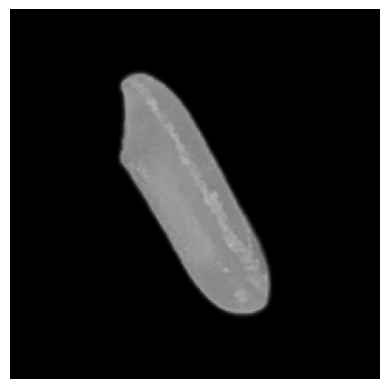

1/1 ━━━━━━━━━━━━━━━━━━━━ 26s 26s/step
File: /content/drive/MyDrive/Skripsi/Dataset/split_dataset/test/ciherang/clean_IMG_0014.png
Identified class: ciherang


In [ ]:
test1 = "/content/drive/MyDrive/Skripsi/Dataset/split_dataset/test/ciherang/clean_IMG_0014.png"
what_is(test1)

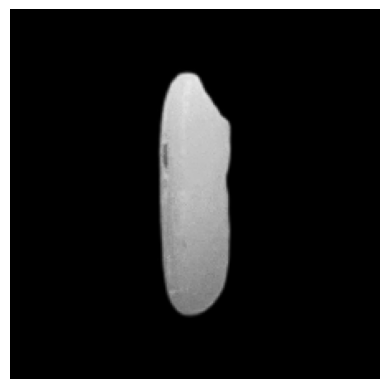

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
File: /content/drive/MyDrive/Skripsi/Dataset/split_dataset/test/ir64/clean_IMG_0014.png
Identified class: ir64


In [ ]:
test2 = "/content/drive/MyDrive/Skripsi/Dataset/split_dataset/test/ir64/clean_IMG_0014.png"
what_is(test2)

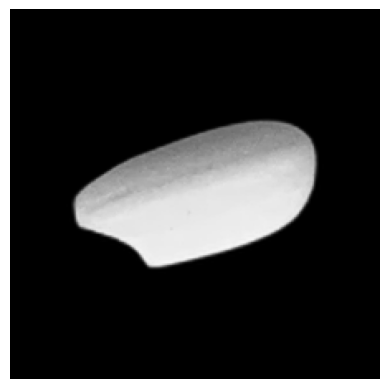

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
File: /content/drive/MyDrive/Skripsi/Dataset/split_dataset/test/mentik/clean_IMG_0014.png
Identified class: mentik


In [ ]:
test3 = "/content/drive/MyDrive/Skripsi/Dataset/split_dataset/test/mentik/clean_IMG_0014.png"
what_is(test3)

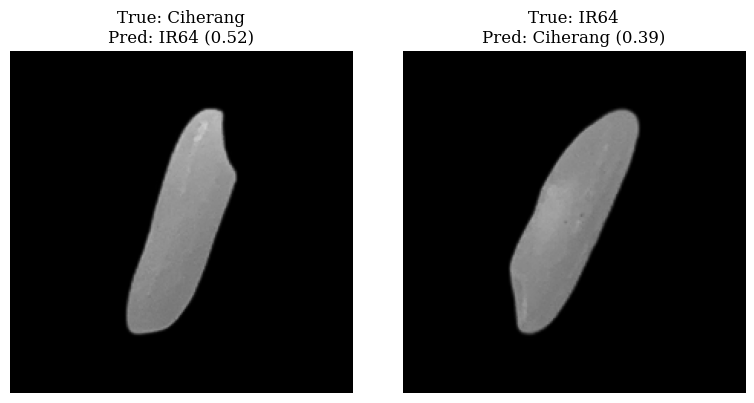

In [ ]:
rice_classes = ['ciherang', 'ir64', 'mentik']
display_names = {'ciherang': 'Ciherang', 'ir64': 'IR64', 'mentik': 'Mentik Susu'}

found = {"ciherang": None, "ir64": None}

for x_batch, y_batch in test_data:
    for i in range(len(x_batch)):
        img = x_batch[i]
        true_idx = np.argmax(y_batch[i]) if y_batch.ndim > 1 else y_batch[i]

        preds = model(tf.expand_dims(img, 0), training=False)
        probs = tf.nn.softmax(preds[0]).numpy()
        pred_idx = np.argmax(probs)

        # Kasus: Ciherang → IR64
        if rice_classes[true_idx] == "ciherang" and rice_classes[pred_idx] == "ir64" and found["ciherang"] is None:
            found["ciherang"] = (img, true_idx, pred_idx, probs[pred_idx])

        # Kasus: IR64 → Ciherang
        if rice_classes[true_idx] == "ir64" and rice_classes[pred_idx] == "ciherang" and found["ir64"] is None:
            found["ir64"] = (img, true_idx, pred_idx, probs[pred_idx])

        if all(found.values()):
            break
    if all(found.values()):
        break

plt.rcParams["font.family"] = "serif"
plt.figure(figsize=(8, 4))
for j, key in enumerate(found):
    if found[key] is not None:
        img, true_idx, pred_idx, conf = found[key]
        plt.subplot(1, 2, j+1)
        if isinstance(img, tf.Tensor):
            img = img.numpy()
        plt.imshow(img.astype("float32"))
        plt.title(
            f"True: {display_names[rice_classes[true_idx]]}\n"
            f"Pred: {display_names[rice_classes[pred_idx]]} ({conf:.2f})"
        )
        plt.axis("off")
    else:
        plt.subplot(1, 2, j+1)
        plt.axis("off")
        plt.title(f"Tidak ditemukan {key} salah prediksi", fontsize=20)

plt.tight_layout()
plt.show()

#11.&nbsp;Rice grain pile test

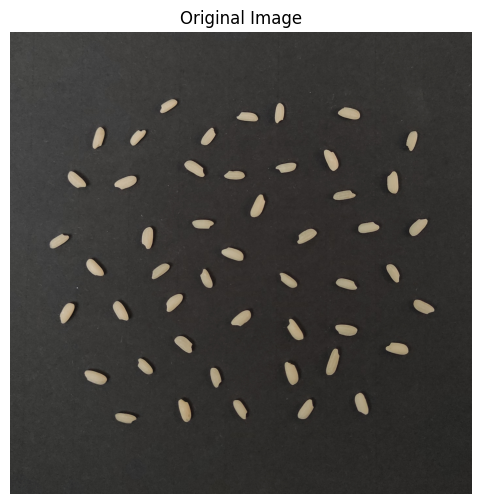

In [ ]:
biji = "/content/beras mentik.jpg"
beras  = Image.open(biji)
plt.figure(figsize=(10,6))
plt.title("Original Image")
plt.axis('off')
plt.imshow(beras)

##11.1 Connected Components

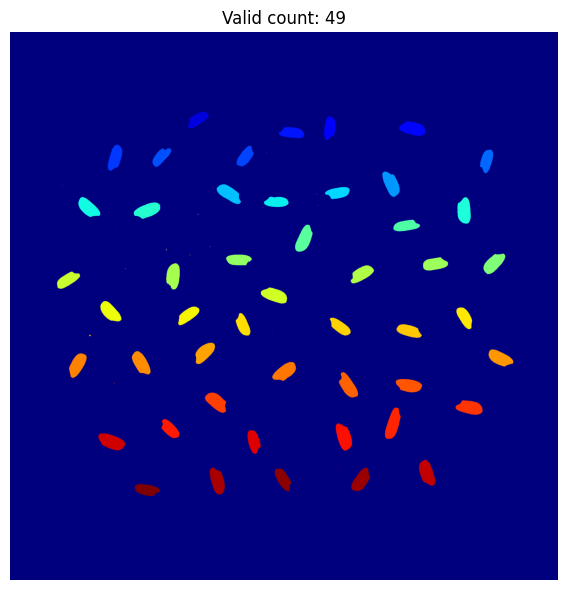

In [ ]:
ori_img = cv2.imread('beras mentik.jpg')
gray = cv2.cvtColor(ori_img, cv2.COLOR_BGR2GRAY)

_, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(binary, connectivity=8)

output_folder = '/content/drive/MyDrive/Skripsi/Dataset/Mentik Susu Test'
os.makedirs(output_folder, exist_ok=True)

count = 0
for i in range(1, num_labels):
    x, y, w, h, area = stats[i]
    cx, cy = centroids[i]
    if area < 60:
        continue

    side = int(max(w, h) * 1.5)
    cx_int, cy_int = int(cx), int(cy)
    x1, y1 = max(0, cx_int - side // 2), max(0, cy_int - side // 2)
    side = min(side, min(gray.shape[1] - x1, gray.shape[0] - y1))

    crop = gray[y1:y1 + side, x1:x1 + side]
    resized = cv2.resize(crop, (250, 250))
    rgb = cv2.cvtColor(resized, cv2.COLOR_GRAY2RGB)

    filename = f'mentik susu {count + 1}.png'
    cv2.imwrite(os.path.join(output_folder, filename), rgb)
    count += 1

plt.figure(figsize=(6, 6))
plt.imshow(labels, cmap='jet')
plt.title(f'Valid count: {count}')
plt.axis('off')
plt.tight_layout()
plt.show()

##11.2 Sanity Check

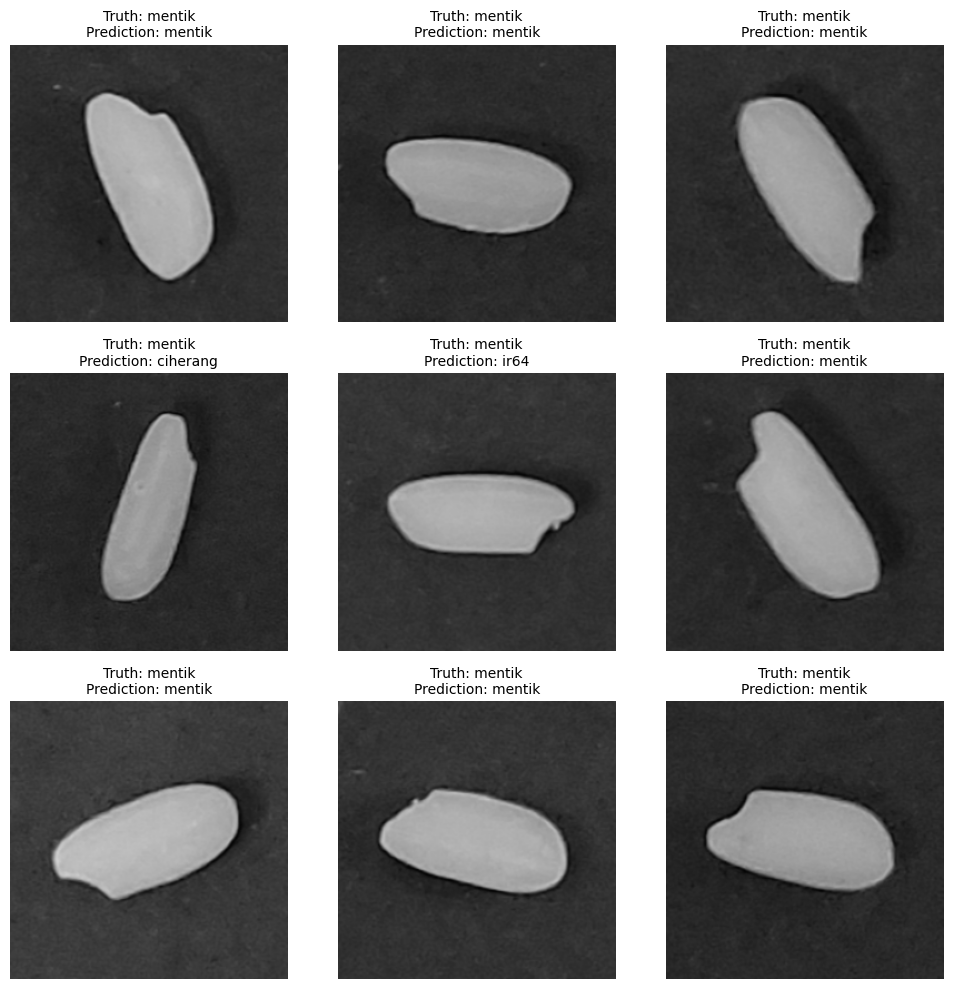

In [ ]:
test_dir = '/content/drive/MyDrive/Skripsi/Dataset/Mentik Susu Test'
image_files = [f for f in os.listdir(test_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))][:9]

plt.figure(figsize=(10, 10))

for i, fname in enumerate(image_files):
    img_path = os.path.join(test_dir, fname)
    img_original = Image.open(img_path).convert("RGB")

    with open(img_path, 'rb') as f:
        input_bytes = f.read()
    output_bytes = remove(input_bytes)
    img_no_bg = Image.open(BytesIO(output_bytes)).convert("RGB")
    img_resized = img_no_bg.resize((224, 224))
    x = image.img_to_array(img_resized) / 255.0

    pred = model.predict(tf.expand_dims(x, 0), verbose=0)
    score = tf.nn.softmax(pred[0])
    pred_label = rice_classes[np.argmax(score)]

    plt.subplot(3, 3, i + 1)
    plt.imshow(img_original)
    plt.title(f"Truth: mentik\nPrediction: {pred_label}", fontsize=10)
    plt.axis('off')

plt.tight_layout()
plt.show()

##11.3 Inference Result

In [ ]:
test_dir = '/content/drive/MyDrive/Skripsi/Dataset/Mentik Susu Test'
image_files = [f for f in os.listdir(test_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

results = []
for fname in image_files:
    img_path = os.path.join(test_dir, fname)

    with open(img_path, 'rb') as f:
        input_bytes = f.read()
        output_bytes = remove(input_bytes)

    img_nobg = Image.open(BytesIO(output_bytes)).convert("RGB")
    img_resized = img_nobg.resize((224, 224))
    x = image.img_to_array(img_resized) / 255.0

    pred = model.predict(tf.expand_dims(x, 0), verbose=0)
    score = tf.nn.softmax(pred[0])
    pred_label = rice_classes[np.argmax(score)]

    results.append({
        'File Name': fname,
        'True Label': 'mentik',
        'Predicted Label': pred_label
    })

df_results = pd.DataFrame(results)
df_results

,File Name,True Label,Predicted Label
0,mentik susu 50.png,mentik,ir64
1,mentik susu 9.png,mentik,mentik
2,mentik susu 37.png,mentik,mentik
3,mentik susu 48.png,mentik,mentik
4,mentik susu 40.png,mentik,ciherang
5,mentik susu 19.png,mentik,ir64
6,mentik susu 36.png,mentik,mentik
7,mentik susu 15.png,mentik,mentik
8,mentik susu 3.png,mentik,mentik
9,mentik susu 39.png,mentik,mentik


##11.4&nbsp;Prediction Test

New data prediction test was conducted on rice grain pile data with direct output

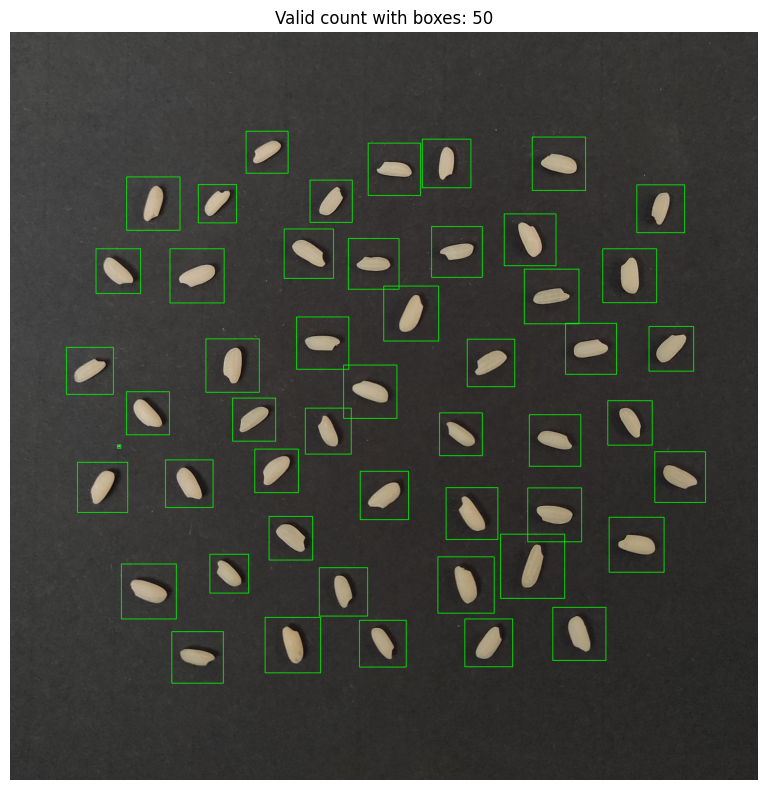

In [ ]:
ori_img = cv2.imread('beras mentik.jpg')
gray = cv2.cvtColor(ori_img, cv2.COLOR_BGR2GRAY)
draw_img = ori_img.copy()

_, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(binary, connectivity=8)

padding = 1.5
count = 0

for i in range(1, num_labels):
    x, y, w, h, area = stats[i]
    if area < 50:
        continue

    s = int(max(w, h) * padding)
    cx, cy = x + w // 2, y + h // 2
    x0 = max(0, cx - s // 2)
    y0 = max(0, cy - s // 2)
    s = min(s, min(gray.shape[1] - x0, gray.shape[0] - y0))

    cv2.rectangle(draw_img, (x0, y0), (x0 + s, y0 + s), (0, 255, 0), 2)
    count += 1

plt.figure(figsize=(8, 8))
plt.imshow(cv2.cvtColor(draw_img, cv2.COLOR_BGR2RGB))
plt.title(f'Valid count with boxes: {count}')
plt.axis('off')
plt.tight_layout()
plt.show()

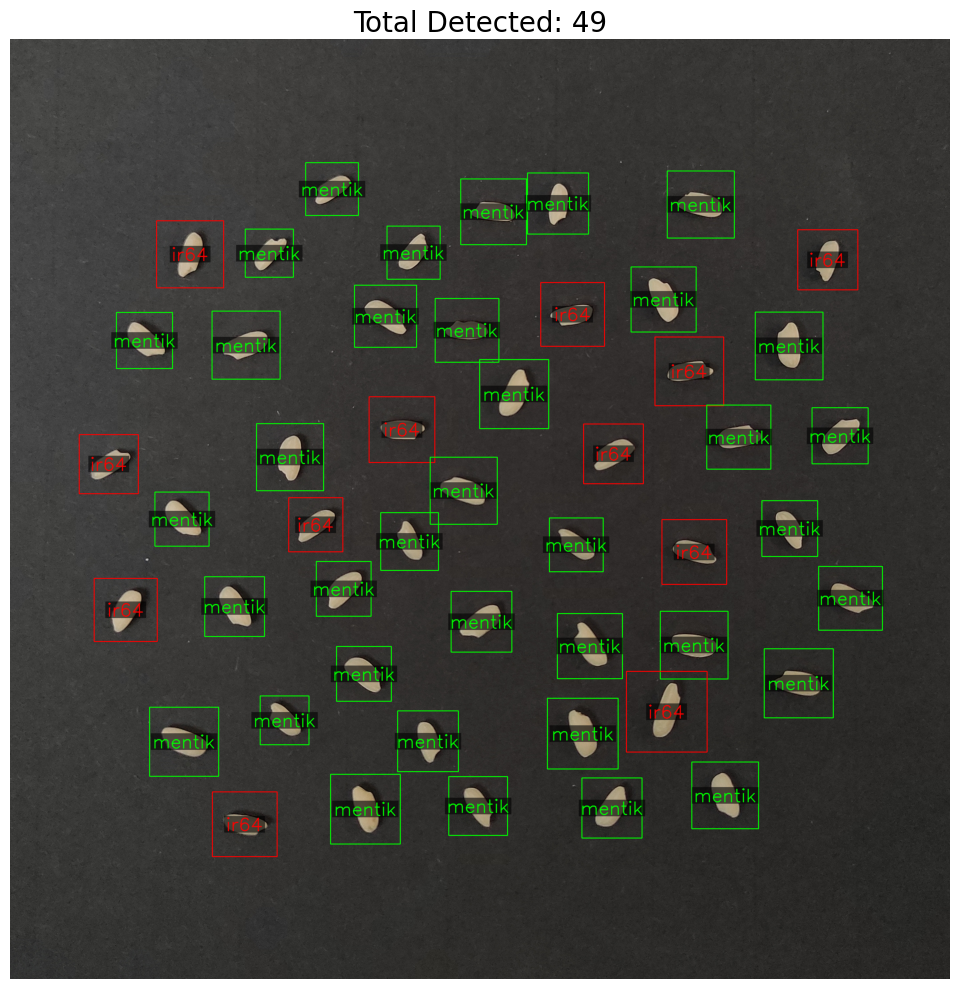

In [ ]:
class_names = ['ciherang', 'ir64', 'mentik']
label_colors = {
    'ciherang': (255, 0, 0),
    'ir64': (0, 0, 255),
    'mentik': (0, 255, 0),
}

img_path = 'multiple grain.jpg'
ori_img = cv2.imread(img_path)
draw_img = ori_img.copy()
gray = cv2.cvtColor(ori_img, cv2.COLOR_BGR2GRAY)

with open(img_path, 'rb') as f:
    input_bytes = f.read()
output_bytes = remove(input_bytes)
img_no_bg = Image.open(BytesIO(output_bytes)).convert("RGB")
img_np = np.array(img_no_bg)

_, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(binary, connectivity=8)

count = 0

for i in range(1, num_labels):
    x, y, w, h, area = stats[i]
    cx, cy = centroids[i]
    if area < 300:
        continue

    side = int(max(w, h) * 1.5)
    cx_int, cy_int = int(cx), int(cy)
    x1 = max(0, cx_int - side // 2)
    y1 = max(0, cy_int - side // 2)
    side = min(side, min(img_np.shape[1] - x1, img_np.shape[0] - y1))

    crop = img_np[y1:y1 + side, x1:x1 + side]
    resized = cv2.resize(crop, (224, 224))
    x_input = tf.expand_dims(resized / 255.0, axis=0)

    pred = model.predict(x_input, verbose=0)
    score = tf.nn.softmax(pred[0])
    label = class_names[np.argmax(score)]
    color = label_colors.get(label, (0, 255, 255))

    cv2.rectangle(draw_img, (x1, y1), (x1 + side, y1 + side), color, 2)

    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 1.8
    thickness = 2

    (text_width, text_height), baseline = cv2.getTextSize(label, font, font_scale, thickness)
    text_x = x1 + (side - text_width) // 2
    text_y = y1 + (side + text_height) // 2

    bg_tl = (text_x - 5, text_y - text_height - 5)
    bg_br = (text_x + text_width + 5, text_y + 5)

    overlay = draw_img.copy()
    cv2.rectangle(overlay, bg_tl, bg_br, (0, 0, 0), -1)
    alpha = 0.6
    cv2.addWeighted(overlay, alpha, draw_img, 1 - alpha, 0, draw_img)

    cv2.putText(draw_img, label, (text_x, text_y), font, font_scale, color, thickness, lineType=cv2.LINE_AA)
    count += 1

plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(draw_img, cv2.COLOR_BGR2RGB))
plt.title(f'Total Detected: {count}',fontsize = 20)
plt.axis('off')
plt.tight_layout()
plt.show()

Test 2

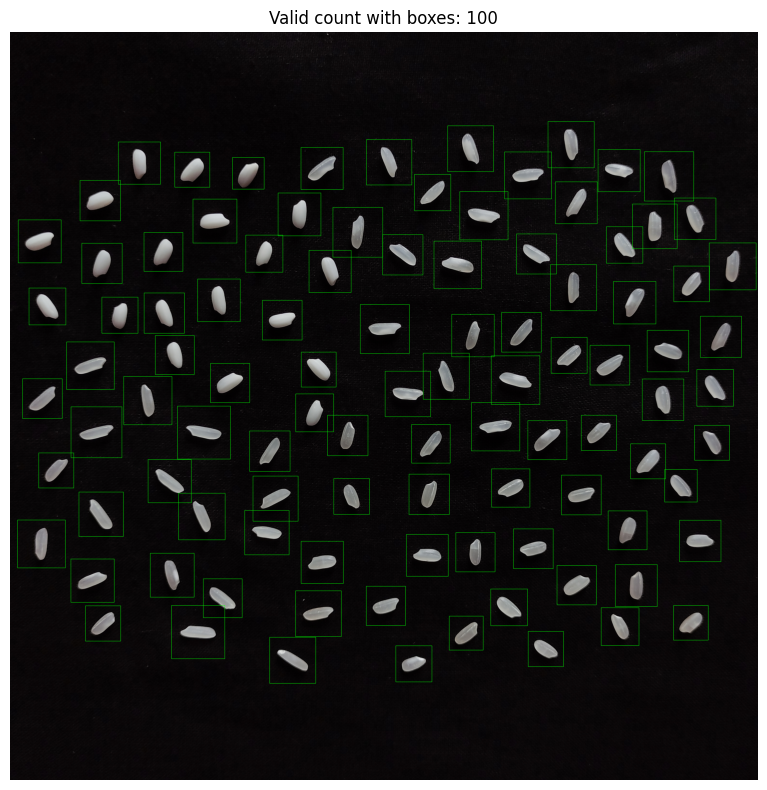

In [ ]:
ori_img = cv2.imread('mixed-grain.jpg')
gray = cv2.cvtColor(ori_img, cv2.COLOR_BGR2GRAY)
draw_img = ori_img.copy()

_, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(binary, connectivity=8)

padding = 1.5
count = 0

for i in range(1, num_labels):
    x, y, w, h, area = stats[i]
    if area < 300:
        continue

    s = int(max(w, h) * padding)
    cx, cy = x + w // 2, y + h // 2
    x0 = max(0, cx - s // 2)
    y0 = max(0, cy - s // 2)
    s = min(s, min(gray.shape[1] - x0, gray.shape[0] - y0))

    cv2.rectangle(draw_img, (x0, y0), (x0 + s, y0 + s), (0, 255, 0), 2)
    count += 1

plt.figure(figsize=(8, 8))
plt.imshow(cv2.cvtColor(draw_img, cv2.COLOR_BGR2RGB))
plt.title(f'Valid count with boxes: {count}')
plt.axis('off')
plt.tight_layout()
plt.show()

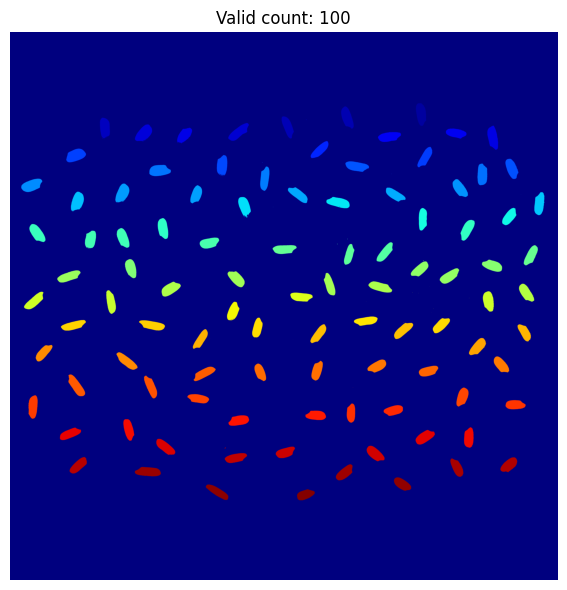

In [ ]:
ori_img = cv2.imread('mixed-grain.jpg')
gray = cv2.cvtColor(ori_img, cv2.COLOR_BGR2GRAY)

_, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(binary, connectivity=8)

output_folder = '/content/drive/MyDrive/Skripsi/Dataset/rice grain'
os.makedirs(output_folder, exist_ok=True)

count = 0
for i in range(1, num_labels):
    x, y, w, h, area = stats[i]
    cx, cy = centroids[i]
    if area < 310:
        continue

    side = int(max(w, h) * 1.5)
    cx_int, cy_int = int(cx), int(cy)
    x1, y1 = max(0, cx_int - side // 2), max(0, cy_int - side // 2)
    side = min(side, min(gray.shape[1] - x1, gray.shape[0] - y1))

    crop = gray[y1:y1 + side, x1:x1 + side]
    resized = cv2.resize(crop, (250, 250))
    rgb = cv2.cvtColor(resized, cv2.COLOR_GRAY2RGB)

    filename = f'rice grain {count + 1}.png'
    cv2.imwrite(os.path.join(output_folder, filename), rgb)
    count += 1

plt.figure(figsize=(6, 6))
plt.imshow(labels, cmap='jet')
plt.title(f'Valid count: {count}')
plt.axis('off')
plt.tight_layout()
plt.show()

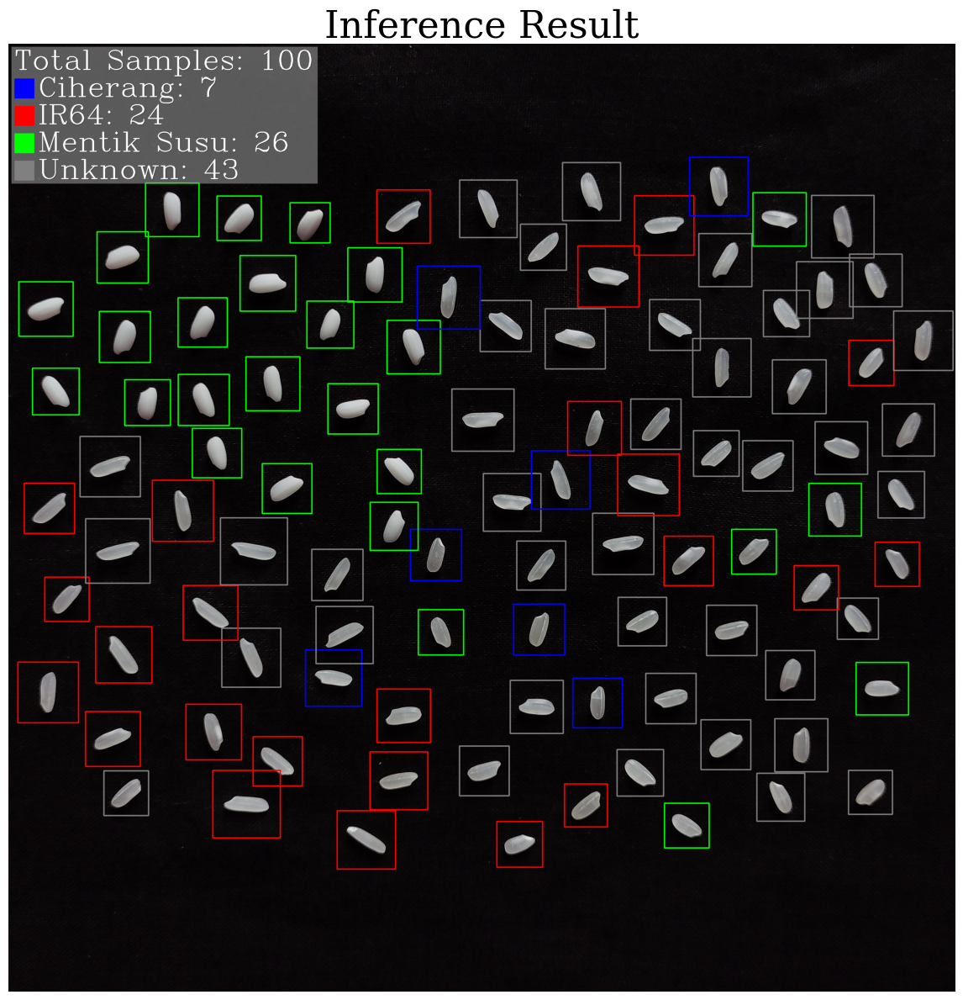

In [ ]:
class_names = ['ciherang', 'ir64', 'mentik']
label_colors = {
    'ciherang': (255, 0, 0),
    'ir64':     (0, 0, 255),
    'mentik':   (0, 255, 0),
    'unknown':  (128, 128, 128)
}

legend_labels = {
    'ciherang': 'Ciherang',
    'ir64':     'IR64',
    'mentik':   'Mentik Susu',
    'unknown':  'Unknown'
}

THRESHOLD = 0.55
SHOW_PER_BOX_LABEL = False
PER_BOX_USE_LEGEND_LABEL = True
PER_BOX_FONT = cv2.FONT_HERSHEY_COMPLEX
PER_BOX_FONT_SCALE = 3.0
PER_BOX_THICKNESS = 5

LEGEND_X, LEGEND_Y = 40, 40
LEGEND_BOX_SIZE = 130
LEGEND_ROW_GAP = 50
LEGEND_TITLE_GAP = 60
LEGEND_PADDING = 20
LEGEND_BG_COLOR = (160, 160, 160)
LEGEND_ALPHA = 0.55

LEGEND_FONT = cv2.FONT_HERSHEY_COMPLEX
LEGEND_FONT_SCALE_TITLE = 6
LEGEND_FONT_SCALE_ITEM  = 6
LEGEND_THICK_TITLE = 6
LEGEND_THICK_ITEM  = 6
LEGEND_TEXT_COLOR = (255, 255, 255)

def put_text_bold(img, text, org, font, font_scale, color, thickness, lineType=cv2.LINE_AA):
    x, y = org
    cv2.putText(img, text, (x+1, y+1), font, font_scale, (0,0,0), thickness+2, lineType)
    cv2.putText(img, text, (x, y),     font, font_scale, color,          thickness,   lineType)

img_path = 'mixed-grain.jpg'
ori_img = cv2.imread(img_path)
draw_img = ori_img.copy()
gray = cv2.cvtColor(ori_img, cv2.COLOR_BGR2GRAY)

with open(img_path, 'rb') as f:
    input_bytes = f.read()
output_bytes = remove(input_bytes)
img_no_bg = Image.open(BytesIO(output_bytes)).convert("RGB")
img_np = np.array(img_no_bg)

_, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

count = 0
class_count = {"ciherang":0, "ir64":0, "mentik":0, "unknown":0}

for cnt in contours:
    x, y, w, h = cv2.boundingRect(cnt)
    area = cv2.contourArea(cnt)
    if area < 300:
        continue

    side = int(max(w, h) * 1.5)
    cx, cy = x + w // 2, y + h // 2
    x1 = max(0, cx - side // 2)
    y1 = max(0, cy - side // 2)
    side = min(side, min(img_np.shape[1] - x1, img_np.shape[0] - y1))
    crop = img_np[y1:y1 + side, x1:x1 + side]

    resized = cv2.resize(crop, (224, 224))
    x_input = tf.expand_dims(resized / 255.0, axis=0)

    pred = FT_aug.predict(x_input, verbose=0)
    score = tf.nn.softmax(pred[0]).numpy()
    max_prob = float(np.max(score))
    pred_label = class_names[int(np.argmax(score))]

    label = pred_label if max_prob >= THRESHOLD else "unknown"
    class_count[label] += 1

    color = label_colors.get(label, (0, 255, 255))
    cv2.rectangle(draw_img, (x1, y1), (x1 + side, y1 + side), color, 8)

    if SHOW_PER_BOX_LABEL:
        text = legend_labels[label] if PER_BOX_USE_LEGEND_LABEL else label
        text_size, _ = cv2.getTextSize(text, PER_BOX_FONT, PER_BOX_FONT_SCALE, PER_BOX_THICKNESS)
        text_x = x1 + (side - text_size[0]) // 2
        text_y = y1 + side + text_size[1] + 8
        text_x = max(0, min(text_x, draw_img.shape[1] - text_size[0] - 2))
        text_y = max(text_size[1] + 8, min(text_y, draw_img.shape[0] - 2))
        put_text_bold(draw_img, text, (text_x, text_y), PER_BOX_FONT, PER_BOX_FONT_SCALE, color, PER_BOX_THICKNESS)

    count += 1

total_samples = sum(class_count.values())
title_text = f"Total Samples: {total_samples}"
( tw_title, th_title ), _ = cv2.getTextSize(title_text, LEGEND_FONT, LEGEND_FONT_SCALE_TITLE, LEGEND_THICK_TITLE)

max_item_w = 0
item_heights = []
for cls in label_colors.keys():
    line_text = f"{legend_labels[cls]}: {class_count[cls]}"
    (tw, th), _ = cv2.getTextSize(line_text, LEGEND_FONT, LEGEND_FONT_SCALE_ITEM, LEGEND_THICK_ITEM)
    max_item_w = max(max_item_w, tw)
    item_heights.append(th)

legend_w_inner = max(LEGEND_BOX_SIZE + 25 + max_item_w, tw_title)
legend_h_inner = th_title + LEGEND_TITLE_GAP + len(label_colors) * max(LEGEND_BOX_SIZE, max(item_heights)) \
                 + (len(label_colors)-1) * LEGEND_ROW_GAP

x0 = LEGEND_X - LEGEND_PADDING
y0 = LEGEND_Y - LEGEND_PADDING
x1 = LEGEND_X + legend_w_inner + LEGEND_PADDING
y1 = LEGEND_Y + legend_h_inner + LEGEND_PADDING

overlay = draw_img.copy()
cv2.rectangle(overlay, (x0, y0), (x1, y1), LEGEND_BG_COLOR, -1)
cv2.addWeighted(overlay, LEGEND_ALPHA, draw_img, 1 - LEGEND_ALPHA, 0, draw_img)

put_text_bold(draw_img, title_text, (LEGEND_X, LEGEND_Y + th_title), LEGEND_FONT,
              LEGEND_FONT_SCALE_TITLE, LEGEND_TEXT_COLOR, LEGEND_THICK_TITLE)

y_cursor = LEGEND_Y + th_title + LEGEND_TITLE_GAP
for cls, color in label_colors.items():
    cv2.rectangle(draw_img, (LEGEND_X, y_cursor),
                  (LEGEND_X + LEGEND_BOX_SIZE, y_cursor + LEGEND_BOX_SIZE), color, -1)

    line_text = f"{legend_labels[cls]}: {class_count[cls]}"
    (tw, th), _ = cv2.getTextSize(line_text, LEGEND_FONT, LEGEND_FONT_SCALE_ITEM, LEGEND_THICK_ITEM)
    tx = LEGEND_X + LEGEND_BOX_SIZE + 25
    ty = y_cursor + LEGEND_BOX_SIZE - 12
    put_text_bold(draw_img, line_text, (tx, ty), LEGEND_FONT,
                  LEGEND_FONT_SCALE_ITEM, LEGEND_TEXT_COLOR, LEGEND_THICK_ITEM)

    y_cursor += max(LEGEND_BOX_SIZE, th) + LEGEND_ROW_GAP

plt.rcParams["font.family"] = "serif"
plt.figure(figsize=(12, 12))
plt.imshow(cv2.cvtColor(draw_img, cv2.COLOR_BGR2RGB))
plt.title("Inference Result", fontsize=32)
plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
class_names = ['ciherang', 'ir64', 'mentik']
THRESHOLD = 0.55              # max softmax prob
MIN_AREA = 300
PRINT_PER_CLASS = True
SAVE_CSV = True

img_path = 'mixed-grain.jpg'

ori_img = cv2.imread(img_path)
if ori_img is None:
    raise ValueError(f"Gagal membaca gambar: {img_path}")

with open(img_path, 'rb') as f:
    input_bytes = f.read()
output_bytes = remove(input_bytes)
img_no_bg = Image.open(BytesIO(output_bytes)).convert("RGB")
img_np = np.array(img_no_bg)  # RGB

# Component segmentation
gray = cv2.cvtColor(ori_img, cv2.COLOR_BGR2GRAY)
_, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

counts = {"ciherang":0, "ir64":0, "mentik":0, "unknown":0}
confs_by_label = {"ciherang":[], "ir64":[], "mentik":[], "unknown":[]}
rows = []

obj_id = 0
for cnt in contours:
    area = cv2.contourArea(cnt)
    if area < MIN_AREA:
        continue

    x, y, w, h = cv2.boundingRect(cnt)
    side = int(max(w, h) * 1.5)
    cx, cy = x + w // 2, y + h // 2
    x1 = max(0, cx - side // 2)
    y1 = max(0, cy - side // 2)
    side = min(side, min(img_np.shape[1] - x1, img_np.shape[0] - y1))
    if side < 10:
        continue

    crop = img_np[y1:y1 + side, x1:x1 + side]
    resized = cv2.resize(crop, (224, 224), interpolation=cv2.INTER_AREA)
    x_input = tf.expand_dims(resized / 255.0, axis=0)

    pred = model.predict(x_input, verbose=0)
    probs = tf.nn.softmax(pred[0]).numpy()
    max_prob = float(np.max(probs))
    top_idx = int(np.argmax(probs))
    top_label = class_names[top_idx]

    label = top_label if max_prob >= THRESHOLD else "unknown"

    counts[label] += 1
    confs_by_label[label].append(max_prob)

    # show confidence per class
    if PRINT_PER_CLASS:
        print(f"{obj_id:03d}  label={label:12s}  max_conf={max_prob:.4f}  "
              f"ciherang={probs[0]:.4f}  ir64={probs[1]:.4f}  mentik={probs[2]:.4f}")
    else:
        print(f"{obj_id:03d}  max_conf={max_prob:.4f}  label={label}")

    rows.append({
        "id": obj_id,
        "label": label,
        "max_confidence": max_prob,
        "ciherang": float(probs[0]),
        "ir64": float(probs[1]),
        "mentik": float(probs[2]),
        "cx": int(cx),
        "cy": int(cy),
        "x": int(x1),
        "y": int(y1),
        "side": int(side),
        "area": float(area),
    })

    obj_id += 1

# Summary
total = sum(counts.values())
print("\n=== RINGKASAN ===")
print(f"Total objek: {total}")
print(f"Count per label: {counts}")

print("\n=== Rata-rata MAX confidence per label ===")
for cls, vals in confs_by_label.items():
    if len(vals) > 0:
        print(f"{cls:12s}: {np.mean(vals):.4f}  (n={len(vals)})")
    else:
        print(f"{cls:12s}: -")

if SAVE_CSV:
    out_path = "confidences.csv"
    with open(out_path, "w", newline="", encoding="utf-8") as f:
        writer = csv.DictWriter(f, fieldnames=list(rows[0].keys()) if rows else
                                ["id","label","max_confidence","ciherang","ir64","mentik","cx","cy","x","y","side","area"])
        writer.writeheader()
        for r in rows:
            writer.writerow(r)
    print(f"\nCSV disimpan: {out_path}")

000  label=ir64          max_conf=0.5743  ciherang=0.2134  ir64=0.5743  mentik=0.2123
001  label=ir64          max_conf=0.5758  ciherang=0.2122  ir64=0.5758  mentik=0.2120
002  label=unknown       max_conf=0.5418  ciherang=0.2393  ir64=0.2188  mentik=0.5418
003  label=ir64          max_conf=0.5755  ciherang=0.2124  ir64=0.5755  mentik=0.2121
004  label=ir64          max_conf=0.5685  ciherang=0.2180  ir64=0.5685  mentik=0.2135
005  label=unknown       max_conf=0.4437  ciherang=0.3253  ir64=0.4437  mentik=0.2310
006  label=unknown       max_conf=0.5346  ciherang=0.2376  ir64=0.2278  mentik=0.5346
007  label=unknown       max_conf=0.4710  ciherang=0.2989  ir64=0.4710  mentik=0.2301
008  label=ir64          max_conf=0.5745  ciherang=0.2132  ir64=0.5745  mentik=0.2123
009  label=unknown       max_conf=0.3995  ciherang=0.3995  ir64=0.3664  mentik=0.2340
010  label=unknown       max_conf=0.3926  ciherang=0.3926  ir64=0.2327  mentik=0.3746
011  label=ir64          max_conf=0.5747  ciherang=0.2

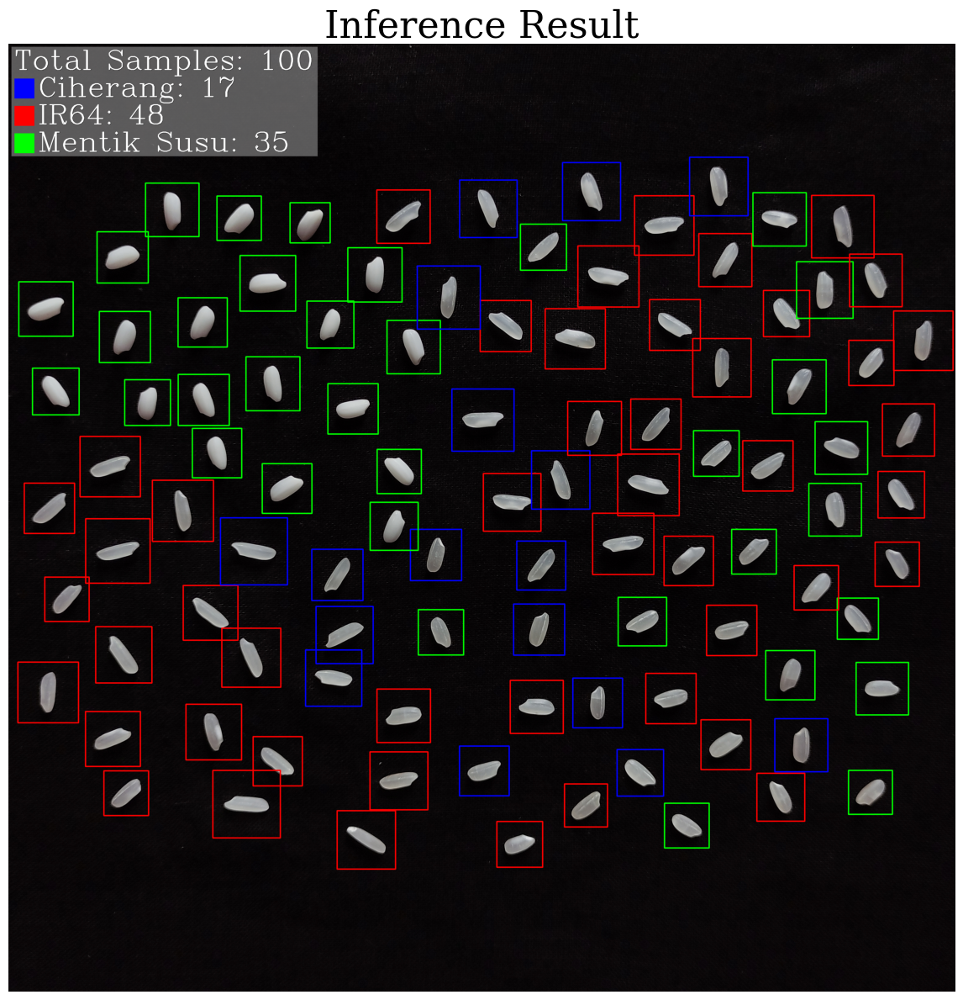

In [ ]:
model = load_model("/content/drive/MyDrive/Skripsi/Logs/New2/model_ft_DB4.keras")

class_names = ['ciherang', 'ir64', 'mentik']
label_colors = {
    'ciherang': (255, 0, 0),
    'ir64':     (0, 0, 255),
    'mentik':   (0, 255, 0),
}
legend_labels = {
    'ciherang': 'Ciherang',
    'ir64':     'IR64',
    'mentik':   'Mentik Susu',
}

SHOW_PER_BOX_LABEL = False
PER_BOX_USE_LEGEND_LABEL = True
PER_BOX_FONT = cv2.FONT_HERSHEY_COMPLEX
PER_BOX_FONT_SCALE = 3.0
PER_BOX_THICKNESS = 5

LEGEND_X, LEGEND_Y = 40, 40
LEGEND_BOX_SIZE = 130
LEGEND_ROW_GAP = 50
LEGEND_TITLE_GAP = 60
LEGEND_PADDING = 20
LEGEND_BG_COLOR = (160, 160, 160)
LEGEND_ALPHA = 0.55

LEGEND_FONT = cv2.FONT_HERSHEY_COMPLEX
LEGEND_FONT_SCALE_TITLE = 6
LEGEND_FONT_SCALE_ITEM  = 6
LEGEND_THICK_TITLE = 6
LEGEND_THICK_ITEM  = 6
LEGEND_TEXT_COLOR = (255, 255, 255)

MIN_AREA = 300

def put_text_bold(img, text, org, font, font_scale, color, thickness, lineType=cv2.LINE_AA):
    x, y = org
    cv2.putText(img, text, (x+1, y+1), font, font_scale, (0,0,0), thickness+2, lineType)
    cv2.putText(img, text, (x, y),     font, font_scale, color,          thickness,   lineType)

img_path = 'mixed-grain.jpg'
ori_img = cv2.imread(img_path)
if ori_img is None:
    raise ValueError(f"Gagal membaca gambar: {img_path}")
draw_img = ori_img.copy()

# rembg
with open(img_path, 'rb') as f:
    input_bytes = f.read()
output_bytes = remove(input_bytes)
img_no_bg = Image.open(BytesIO(output_bytes)).convert("RGB")
img_np = np.array(img_no_bg)  # RGB (no-bg)

# segment
gray = cv2.cvtColor(ori_img, cv2.COLOR_BGR2GRAY)
_, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# inference
class_count = {k: 0 for k in class_names}
for cnt in contours:
    x, y, w, h = cv2.boundingRect(cnt)
    area = cv2.contourArea(cnt)
    if area < MIN_AREA:
        continue

    side = int(max(w, h) * 1.5)
    cx, cy = x + w // 2, y + h // 2
    x1 = max(0, cx - side // 2)
    y1 = max(0, cy - side // 2)
    side = min(side, min(img_np.shape[1] - x1, img_np.shape[0] - y1))
    if side < 10:
        continue

    crop = img_np[y1:y1 + side, x1:x1 + side]
    resized = cv2.resize(crop, (224, 224), interpolation=cv2.INTER_AREA)
    x_input = tf.expand_dims(resized.astype(np.float32) / 255.0, axis=0)

    pred  = model.predict(x_input, verbose=0)
    score = tf.nn.softmax(pred[0]).numpy()
    pred_label = class_names[int(np.argmax(score))]
    class_count[pred_label] += 1

    # BB
    color = label_colors.get(pred_label, (0, 255, 255))
    cv2.rectangle(draw_img, (x1, y1), (x1 + side, y1 + side), color, 8)
    if SHOW_PER_BOX_LABEL:
        text = legend_labels[pred_label] if PER_BOX_USE_LEGEND_LABEL else pred_label
        text_size, _ = cv2.getTextSize(text, PER_BOX_FONT, PER_BOX_FONT_SCALE, PER_BOX_THICKNESS)
        text_x = x1 + (side - text_size[0]) // 2
        text_y = y1 + side + text_size[1] + 8
        text_x = max(0, min(text_x, draw_img.shape[1] - text_size[0] - 2))
        text_y = max(text_size[1] + 8, min(text_y, draw_img.shape[0] - 2))
        put_text_bold(draw_img, text, (text_x, text_y), PER_BOX_FONT, PER_BOX_FONT_SCALE, color, PER_BOX_THICKNESS)

# legend
total_samples = sum(class_count.values())
title_text = f"Total Samples: {total_samples}"
( tw_title, th_title ), _ = cv2.getTextSize(title_text, LEGEND_FONT, LEGEND_FONT_SCALE_TITLE, LEGEND_THICK_TITLE)

max_item_w = 0
item_heights = []
for cls in class_names:
    line_text = f"{legend_labels[cls]}: {class_count[cls]}"
    (tw, th), _ = cv2.getTextSize(line_text, LEGEND_FONT, LEGEND_FONT_SCALE_ITEM, LEGEND_THICK_ITEM)
    max_item_w = max(max_item_w, tw)
    item_heights.append(th)

legend_w_inner = max(LEGEND_BOX_SIZE + 25 + max_item_w, tw_title)
legend_h_inner = th_title + LEGEND_TITLE_GAP + len(class_names) * max(LEGEND_BOX_SIZE, max(item_heights)) \
                 + (len(class_names)-1) * LEGEND_ROW_GAP

x0 = LEGEND_X - LEGEND_PADDING
y0 = LEGEND_Y - LEGEND_PADDING
x1 = LEGEND_X + legend_w_inner + LEGEND_PADDING
y1 = LEGEND_Y + legend_h_inner + LEGEND_PADDING

overlay = draw_img.copy()
cv2.rectangle(overlay, (x0, y0), (x1, y1), LEGEND_BG_COLOR, -1)
cv2.addWeighted(overlay, LEGEND_ALPHA, draw_img, 1 - LEGEND_ALPHA, 0, draw_img)

put_text_bold(draw_img, title_text, (LEGEND_X, LEGEND_Y + th_title), LEGEND_FONT,
              LEGEND_FONT_SCALE_TITLE, LEGEND_TEXT_COLOR, LEGEND_THICK_TITLE)

y_cursor = LEGEND_Y + th_title + LEGEND_TITLE_GAP
for cls in class_names:
    color = label_colors[cls]
    cv2.rectangle(draw_img, (LEGEND_X, y_cursor),
                  (LEGEND_X + LEGEND_BOX_SIZE, y_cursor + LEGEND_BOX_SIZE), color, -1)

    line_text = f"{legend_labels[cls]}: {class_count[cls]}"
    (tw, th), _ = cv2.getTextSize(line_text, LEGEND_FONT, LEGEND_FONT_SCALE_ITEM, LEGEND_THICK_ITEM)
    tx = LEGEND_X + LEGEND_BOX_SIZE + 25
    ty = y_cursor + LEGEND_BOX_SIZE - 12
    put_text_bold(draw_img, line_text, (tx, ty), LEGEND_FONT,
                  LEGEND_FONT_SCALE_ITEM, LEGEND_TEXT_COLOR, LEGEND_THICK_ITEM)
    y_cursor += max(LEGEND_BOX_SIZE, th) + LEGEND_ROW_GAP

# show
plt.rcParams["font.family"] = "serif"
plt.figure(figsize=(12, 12))
plt.imshow(cv2.cvtColor(draw_img, cv2.COLOR_BGR2RGB))
plt.title("Inference Result", fontsize=32)
plt.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
model = load_model("/content/drive/MyDrive/Skripsi/Logs/New2/model_ft_DB4.keras")
class_names = ['ciherang', 'ir64', 'mentik']
MIN_AREA = 300
PRINT_PER_CLASS = True
SAVE_CSV = True

img_path = 'mixed-grain.jpg'

ori_img = cv2.imread(img_path)
if ori_img is None:
    raise ValueError(f"Gagal membaca gambar: {img_path}")

# rembg
with open(img_path, 'rb') as f:
    input_bytes = f.read()
output_bytes = remove(input_bytes)
img_no_bg = Image.open(BytesIO(output_bytes)).convert("RGB")
img_np = np.array(img_no_bg)  # RGB

# segment
gray = cv2.cvtColor(ori_img, cv2.COLOR_BGR2GRAY)
_, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

counts = {"ciherang":0, "ir64":0, "mentik":0}
confs_by_label = {"ciherang":[], "ir64":[], "mentik":[]}
rows = []  # untuk CSV

obj_id = 0
for cnt in contours:
    area = cv2.contourArea(cnt)
    if area < MIN_AREA:
        continue

    x, y, w, h = cv2.boundingRect(cnt)
    side = int(max(w, h) * 1.5)
    cx, cy = x + w // 2, y + h // 2
    x1 = max(0, cx - side // 2)
    y1 = max(0, cy - side // 2)
    side = min(side, min(img_np.shape[1] - x1, img_np.shape[0] - y1))
    if side < 10:
        continue

    crop = img_np[y1:y1 + side, x1:x1 + side]
    resized = cv2.resize(crop, (224, 224), interpolation=cv2.INTER_AREA)
    x_input = tf.expand_dims(resized / 255.0, axis=0)

    pred = model.predict(x_input, verbose=0)
    probs = tf.nn.softmax(pred[0]).numpy()
    top_idx = int(np.argmax(probs))
    top_label = class_names[top_idx]
    max_prob = float(probs[top_idx])

    label = top_label

    counts[label] += 1
    confs_by_label[label].append(max_prob)

    # show confidence per class
    if PRINT_PER_CLASS:
        print(f"{obj_id:03d}  label={label:8s}  max_conf={max_prob:.4f}  "
              f"ciherang={probs[0]:.4f}  ir64={probs[1]:.4f}  mentik={probs[2]:.4f}")
    else:
        print(f"{obj_id:03d}  label={label}  max_conf={max_prob:.4f}")

    rows.append({
        "id": obj_id,
        "label": label,
        "max_confidence": max_prob,
        "ciherang": float(probs[0]),
        "ir64": float(probs[1]),
        "mentik": float(probs[2]),
        "cx": int(cx),
        "cy": int(cy),
        "x": int(x1),
        "y": int(y1),
        "side": int(side),
        "area": float(area),
    })

    obj_id += 1

# summary
total = sum(counts.values())
print("\n=== RINGKASAN ===")
print(f"Total objek: {total}")
print(f"Count per label: {counts}")

print("\n=== Rata-rata MAX confidence per label ===")
for cls, vals in confs_by_label.items():
    if len(vals) > 0:
        print(f"{cls:8s}: {np.mean(vals):.4f}  (n={len(vals)})")
    else:
        print(f"{cls:8s}: -")

if SAVE_CSV:
    out_path = "confidences.csv"
    header = ["id","label","max_confidence","ciherang","ir64","mentik",
              "cx","cy","x","y","side","area"]
    with open(out_path, "w", newline="", encoding="utf-8") as f:
        writer = csv.DictWriter(f, fieldnames=header)
        writer.writeheader()
        for r in rows:
            writer.writerow(r)
    print(f"\nCSV disimpan: {out_path}")


000  label=ir64      max_conf=0.5743  ciherang=0.2134  ir64=0.5743  mentik=0.2123
001  label=ir64      max_conf=0.5758  ciherang=0.2122  ir64=0.5758  mentik=0.2120
002  label=mentik    max_conf=0.5418  ciherang=0.2393  ir64=0.2188  mentik=0.5418
003  label=ir64      max_conf=0.5755  ciherang=0.2124  ir64=0.5755  mentik=0.2121
004  label=ir64      max_conf=0.5685  ciherang=0.2180  ir64=0.5685  mentik=0.2135
005  label=ir64      max_conf=0.4437  ciherang=0.3253  ir64=0.4437  mentik=0.2310
006  label=mentik    max_conf=0.5346  ciherang=0.2376  ir64=0.2278  mentik=0.5346
007  label=ir64      max_conf=0.4710  ciherang=0.2989  ir64=0.4710  mentik=0.2301
008  label=ir64      max_conf=0.5745  ciherang=0.2132  ir64=0.5745  mentik=0.2123
009  label=ciherang  max_conf=0.3995  ciherang=0.3995  ir64=0.3664  mentik=0.2340
010  label=ciherang  max_conf=0.3926  ciherang=0.3926  ir64=0.2327  mentik=0.3746
011  label=ir64      max_conf=0.5747  ciherang=0.2131  ir64=0.5747  mentik=0.2122
012  label=ir64 

#13.&nbsp;Streamlit Deployment

Streamlit Deployment can be accessed via the following link:
[DenseNet-201 Rice Variety Classification](https://densenet201-rice-variety-classification2.streamlit.app/)

Preview:
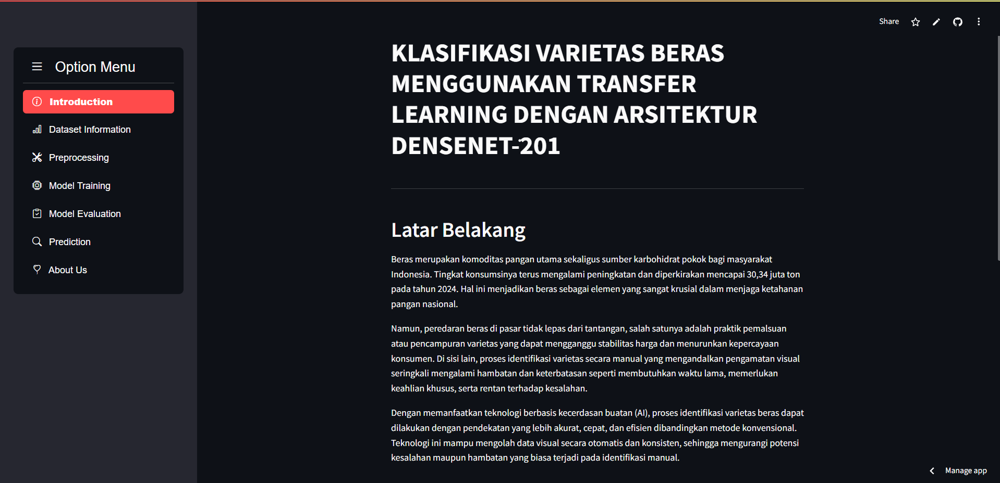